## BIG DATA REPORT CODE WITH FOCUS ON 2020


#### IMPORT THE REQUIRED LIBRARIES

In [1]:
import sqlite3
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from  ydata_profiling import ProfileReport # Used ydata profiling as pandas profiling is now depreciated
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings(action='ignore', category=FutureWarning)


# Import the ImputationKernel module and create the kernel for imputation
from miceforest import ImputationKernel

import matplotlib.gridspec as gridspec #To allow me to directly control the layout of my subplots

# Importing for Apriori algorithm
from mlxtend.frequent_patterns import apriori, association_rules

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

import folium
from folium.plugins import MarkerCluster # For maps
import json
from shapely.geometry import Polygon

from sklearn.ensemble import IsolationForest
from imblearn.under_sampling import RandomUnderSampler
from sklearn.feature_selection import SelectKBest, f_classif

from sklearn.model_selection import train_test_split, cross_validate
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix

In [2]:
#pip install numpy

In [3]:
#pip install matplotlib

In [4]:
#pip install seaborn 

In [5]:
#pip install miceforest

In [6]:
#pip install mlxtend

In [7]:
#!pip install folium

In [8]:
#pip install shapely

In [9]:
#pip install imbalanced-learn 

In [10]:
# Create a connection to the database
con = sqlite3.connect('accident_data_v1.0.0_2023.db')

In [11]:
# Create a cursor object to execute query and fetch results
cur = con.cursor()

In [12]:
# Read accident data into a pandas dataframe using the above connection
accident_df_2020 = pd.read_sql('SELECT * FROM accident WHERE accident_year = 2020', con)

In [13]:
# Read vehicle data into a pandas dataframe using the above connection
vehicle_df_2020 = pd.read_sql('SELECT * FROM vehicle WHERE accident_year = 2020', con)

In [14]:
# Read casualty data into a pandas dataframe using the above connection
casualty_df_2020 = pd.read_sql('SELECT * FROM casualty WHERE accident_year = 2020', con)

In [15]:
lsoa_df = pd.read_sql('SELECT * FROM lsoa', con)

### EXPLORATORY DATA ANALYSIS (EDA)

In [16]:
accident_df_2020.sample(5) # Selects a random sample of 5 rows from the DataFrame acc_df_2020

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
77304,2020500936312,2020,500936312,288318.0,61581.0,-3.574221,50.443400,50,3,1,...,0,1,2,2,0,2,1,2,2,E01015203
15092,2020010271332,2020,010271332,512712.0,173602.0,-0.379342,51.450195,1,3,1,...,5,1,2,2,0,2,1,1,2,E01003841
14961,2020010270971,2020,010270971,536707.0,189703.0,-0.027986,51.589603,1,2,2,...,0,1,8,2,0,0,1,1,2,E01004458
37884,2020160924609,2020,160924609,526646.0,406696.0,-0.090295,53.541668,16,3,2,...,0,5,1,2,0,0,1,2,2,E01013185
73355,2020461002012,2020,461002012,544269.0,146128.0,0.063403,51.196161,46,3,2,...,5,1,2,2,0,0,2,1,2,E01024429


In [17]:
accident_df_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91199 entries, 0 to 91198
Data columns (total 36 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   accident_index                               91199 non-null  object 
 1   accident_year                                91199 non-null  int64  
 2   accident_reference                           91199 non-null  object 
 3   location_easting_osgr                        91185 non-null  float64
 4   location_northing_osgr                       91185 non-null  float64
 5   longitude                                    91185 non-null  float64
 6   latitude                                     91185 non-null  float64
 7   police_force                                 91199 non-null  int64  
 8   accident_severity                            91199 non-null  int64  
 9   number_of_vehicles                           91199 non-null  int64  
 10

In [18]:
accident_df_2020.isnull().sum()

accident_index                                  0
accident_year                                   0
accident_reference                              0
location_easting_osgr                          14
location_northing_osgr                         14
longitude                                      14
latitude                                       14
police_force                                    0
accident_severity                               0
number_of_vehicles                              0
number_of_casualties                            0
date                                            0
day_of_week                                     0
time                                            0
local_authority_district                        0
local_authority_ons_district                    0
local_authority_highway                         0
first_road_class                                0
first_road_number                               0
road_type                                       0


Notable **missing values** in location_easting_osgr, location_northing_osgr, longitude and latitude. Although other columns does not have missing values, does not mean they are no inconsistencies in them.                                     

In [19]:
# Checking the summary statistics of the data before cleaning to get a better understanding of the how the cleaning went
accident_df_2020.describe(include = 'all').T 

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
accident_index,91199,91199,2020010219808,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
accident_year,91199.0,NaN,NaN,NaN,2020.0,0.0,2020.0,2020.0,2020.0,2020.0,2020.0
accident_reference,91199,91199,010219808,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
location_easting_osgr,91185.0,NaN,NaN,NaN,456487.876416,93512.711807,65947.0,392890.0,465545.0,530168.0,655138.0
location_northing_osgr,91185.0,NaN,NaN,NaN,273764.496233,147351.556104,12715.0,174569.0,208599.0,378366.0,1184351.0
longitude,91185.0,NaN,NaN,NaN,-1.189258,1.367786,-7.497375,-2.107789,-1.046912,-0.125238,1.756257
latitude,91185.0,NaN,NaN,NaN,52.351073,1.327573,49.970479,51.457237,51.763385,53.297386,60.541144
police_force,91199.0,NaN,NaN,NaN,27.488043,24.548964,1.0,4.0,22.0,45.0,99.0
accident_severity,91199.0,NaN,NaN,NaN,2.768232,0.456682,1.0,3.0,3.0,3.0,3.0
number_of_vehicles,91199.0,NaN,NaN,NaN,1.835272,0.677272,1.0,1.0,2.0,2.0,13.0


In [20]:
vehicle_df_2020.sample(5) # Selects a random sample of 5 rows from the DataFrame veh_df_2020

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
75605,757321,2020200948992,2020,200948992,1,9,0,9,3,8,...,6,2,52,8,1794,1,16,TOYOTA CELICA,4,1
3136,684852,2020010233812,2020,010233812,2,9,0,18,7,3,...,6,2,22,5,1390,1,8,SEAT IBIZA,6,1
115075,796791,2020430026818,2020,430026818,1,9,0,9,2,8,...,2,1,38,7,1798,1,15,FORD FOCUS,10,1
117962,799678,2020430273958,2020,430273958,2,9,0,7,8,2,...,6,1,-1,-1,-1,-1,-1,-1,-1,-1
160285,842001,202063C043520,2020,63C043520,1,9,0,13,6,2,...,6,1,76,11,1896,2,18,AUDI A4,5,3


In [21]:
vehicle_df_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167375 entries, 0 to 167374
Data columns (total 28 columns):
 #   Column                            Non-Null Count   Dtype 
---  ------                            --------------   ----- 
 0   vehicle_index                     167375 non-null  int64 
 1   accident_index                    167375 non-null  object
 2   accident_year                     167375 non-null  int64 
 3   accident_reference                167375 non-null  object
 4   vehicle_reference                 167375 non-null  int64 
 5   vehicle_type                      167375 non-null  int64 
 6   towing_and_articulation           167375 non-null  int64 
 7   vehicle_manoeuvre                 167375 non-null  int64 
 8   vehicle_direction_from            167375 non-null  int64 
 9   vehicle_direction_to              167375 non-null  int64 
 10  vehicle_location_restricted_lane  167375 non-null  int64 
 11  junction_location                 167375 non-null  int64 
 12  sk

In [22]:
vehicle_df_2020.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
vehicle_index,167375.0,NaN,NaN,NaN,765403.0,48317.14499,681716.0,723559.5,765403.0,807246.5,849090.0
accident_index,167375,91199,2020430342787,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN
accident_year,167375.0,NaN,NaN,NaN,2020.0,0.0,2020.0,2020.0,2020.0,2020.0,2020.0
accident_reference,167375,91199,430342787,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN
vehicle_reference,167375.0,NaN,NaN,NaN,1.549198,2.538196,1.0,1.0,1.0,2.0,999.0
vehicle_type,167375.0,NaN,NaN,NaN,10.05131,11.692412,1.0,9.0,9.0,9.0,98.0
towing_and_articulation,167375.0,NaN,NaN,NaN,0.221664,1.34423,-1.0,0.0,0.0,0.0,9.0
vehicle_manoeuvre,167375.0,NaN,NaN,NaN,19.538987,23.661274,-1.0,9.0,18.0,18.0,99.0
vehicle_direction_from,167375.0,NaN,NaN,NaN,4.406387,2.718826,-1.0,2.0,5.0,7.0,9.0
vehicle_direction_to,167375.0,NaN,NaN,NaN,4.455068,2.696937,-1.0,2.0,5.0,7.0,9.0


In [23]:
casualty_df_2020.sample(5) # Selects a random sample of 5 rows from the DataFrame cas_df_2020

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
17451,502199,2020010271157,2020,010271157,1,1,1,1,32,6,2,0,0,0,0,0,1,1,4
22341,507089,2020010282913,2020,010282913,1,2,2,2,38,7,3,0,0,0,4,0,11,1,1
111164,595912,2020990927676,2020,990927676,1,1,1,2,67,10,3,0,0,0,0,0,9,3,4
110522,595270,202063D065820,2020,63D065820,1,2,1,1,25,5,3,0,0,0,0,0,9,1,3
52790,537538,2020200998507,2020,200998507,1,1,1,2,49,8,3,0,0,0,0,0,9,1,5


In [24]:
casualty_df_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115584 entries, 0 to 115583
Data columns (total 19 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   casualty_index                      115584 non-null  int64 
 1   accident_index                      115584 non-null  object
 2   accident_year                       115584 non-null  int64 
 3   accident_reference                  115584 non-null  object
 4   vehicle_reference                   115584 non-null  int64 
 5   casualty_reference                  115584 non-null  int64 
 6   casualty_class                      115584 non-null  int64 
 7   sex_of_casualty                     115584 non-null  int64 
 8   age_of_casualty                     115584 non-null  int64 
 9   age_band_of_casualty                115584 non-null  int64 
 10  casualty_severity                   115584 non-null  int64 
 11  pedestrian_location                 115

In [25]:
casualty_df_2020.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
casualty_index,115584.0,NaN,NaN,NaN,542539.5,33366.371094,484748.0,513643.75,542539.5,571435.25,600331.0
accident_index,115584,91199,2020440349165,41,NaN,NaN,NaN,NaN,NaN,NaN,NaN
accident_year,115584.0,NaN,NaN,NaN,2020.0,0.0,2020.0,2020.0,2020.0,2020.0,2020.0
accident_reference,115584,91199,440349165,41,NaN,NaN,NaN,NaN,NaN,NaN,NaN
vehicle_reference,115584.0,NaN,NaN,NaN,1.460557,2.991765,1.0,1.0,1.0,2.0,999.0
casualty_reference,115584.0,NaN,NaN,NaN,1.34779,4.036721,1.0,1.0,1.0,1.0,992.0
casualty_class,115584.0,NaN,NaN,NaN,1.441272,0.708365,1.0,1.0,1.0,2.0,3.0
sex_of_casualty,115584.0,NaN,NaN,NaN,1.354859,0.520195,-1.0,1.0,1.0,2.0,9.0
age_of_casualty,115584.0,NaN,NaN,NaN,36.489748,18.985022,-1.0,23.0,33.0,50.0,99.0
age_band_of_casualty,115584.0,NaN,NaN,NaN,6.29261,2.392856,-1.0,5.0,6.0,8.0,11.0


In [26]:
lsoa_df.head() #Prints the first five rows

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,1,E01000001,City of London 001A,City of London 001A,1.298652e+05,2635.772001,68cc6127-1008-4fbe-a16c-78fb089a7c43
1,2,E01000002,City of London 001B,City of London 001B,2.284189e+05,2707.986202,937edbc3-c1bf-4d35-b274-b0a1480a7c09
2,3,E01000003,City of London 001C,City of London 001C,5.905477e+04,1224.774479,2686dcaf-10b9-4736-92af-4788d4feaa69
3,4,E01000004,City of London 001D,City of London 001D,2.544551e+06,10718.466240,3c493140-0b3f-4b9a-b358-22011dc5fb89
4,5,E01000005,City of London 001E,City of London 001E,1.895782e+05,2275.809358,b569093d-788d-41be-816c-d6d7658b2311


###  DATA CLEANING

To address the inconsistencies in these columns, I will treat the -1 as NaN (indicative of missing data) alongside with other missing values. Subsequently, I will employ Multiple Imputation by Chained Equations (MICE) to impute these missing values. MICE, being a multivariate imputation technique, fills in missing data based on patterns observed across other columns. It operates under the assumption that data is missing at random (MAR). In the context of these columns, this MAR assumption aligns with what's outlined in the Stats19 form. After the imputation cycle concludes, the missing values should be seamlessly substituted with predicted values that mirror the inherent patterns and relationships in the dataset.
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3074241/

Multiple imputation is a potent method for managing missing data involving multiple variables and data types. It surpasses basic imputation techniques like mean and median imputations https://link.springer.com/article/10.1007/s42979-020-00131-0. The method employs algorithms like K-Nearest Neighbors, Random Forest, and neural networks to predict and replace missing values, resulting in more accurate and comprehensive datasets.

To use MICE, I will need to install the library using pip and this has been done above.

#### ACCIDENT TABLE

In [27]:
'''
Converting the wrong value (-1) in the columns to NaN value (missing data). 
This function will also ensure integer columns remain as integers and originally float columns remain as floats.
'''

def convert_invalid_to_nan(df):
    # Define the values to be replaced with NaN
    replacement = {-1: np.nan}

    # Replacing the specified values in the dataframe and track which columns were modified
    replaced_columns = []
    for col in df.columns:
        if (df[col] == -1).any():  # Checking for the presence of -1 using Pandas methods
            replaced_columns.append(col)
            df[col].replace(replacement, inplace=True)

    # Print success messages for replaced columns
    if replaced_columns:
        print(f"Successfully replaced invalid values with NaN in columns: {', '.join(replaced_columns)}")

    # Convert columns that were int before replacement back to integers
    for col in df.columns:
        # If the column was originally a float, skip it
        if df[col].dtype == float and not df[col].dropna().apply(float.is_integer).all():
            continue

        # For integer columns that might have turned float due to NaN
        if df[col].dtype == float and df[col].dropna().apply(float.is_integer).all():
            df[col] = df[col].astype('Int64', errors='ignore')
            print(f"Successfully converted column '{col}' back to integer.")

    return df


In [28]:
acc = accident_df_2020.copy() # Reassigning because I want to clean a copy of the dataframe

In [29]:
# Calling the function
cleaned_accident_df = convert_invalid_to_nan(acc)

Successfully replaced invalid values with NaN in columns: local_authority_district, speed_limit, junction_detail, junction_control, second_road_class, second_road_number, pedestrian_crossing_human_control, pedestrian_crossing_physical_facilities, light_conditions, weather_conditions, road_surface_conditions, special_conditions_at_site, carriageway_hazards, did_police_officer_attend_scene_of_accident, trunk_road_flag
Successfully converted column 'location_easting_osgr' back to integer.
Successfully converted column 'location_northing_osgr' back to integer.
Successfully converted column 'local_authority_district' back to integer.
Successfully converted column 'speed_limit' back to integer.
Successfully converted column 'junction_detail' back to integer.
Successfully converted column 'junction_control' back to integer.
Successfully converted column 'second_road_class' back to integer.
Successfully converted column 'second_road_number' back to integer.
Successfully converted column 'pedes

In [30]:
accident_df_2020.isnull().sum()

accident_index                                  0
accident_year                                   0
accident_reference                              0
location_easting_osgr                          14
location_northing_osgr                         14
longitude                                      14
latitude                                       14
police_force                                    0
accident_severity                               0
number_of_vehicles                              0
number_of_casualties                            0
date                                            0
day_of_week                                     0
time                                            0
local_authority_district                        0
local_authority_ons_district                    0
local_authority_highway                         0
first_road_class                                0
first_road_number                               0
road_type                                       0


In [31]:
cleaned_accident_df = cleaned_accident_df.drop(['accident_index', 'accident_reference', 'date', 'time', 
                                                'local_authority_ons_district', 'local_authority_highway',
                                                'lsoa_of_accident_location'], axis= 1)

# Dropping the object columns as MICE does not work on object columns.

In [32]:
# The ImputationKernel has been imported in the beginning of the notebook
def impute_missing_values(df, num_iterations=3, random_state=4, store_iterations=True, verbose=False):
    """
    Apply Multiple Imputation by Chained Equations (MICE) on the given dataframe.

    Parameters:
    - df: The input dataframe with missing values.
    - num_iterations: Number of MICE iterations. I have set default to 3
    - random_state: Random seed for reproducibility. I have set default to 4
    - store_iterations: Whether to save the results of each iteration. I have set default to True
    - verbose: Whether to print additional information during the imputation process. I have set default to False.

    Returns:
    A dataframe with missing values imputed using MICE.
    """
    try:
        # Initialize the ImputationKernel with the provided data
        mice_kernel = ImputationKernel(
            data=df,
            save_all_iterations=store_iterations,
            random_state=random_state
        )

        # Apply MICE for the specified number of iterations
        mice_kernel.mice(num_iterations)
        
        # Get the dataframe with imputed values
        mice_imputation = mice_kernel.complete_data()

        # Prints additional information if verbose is True
        if verbose:
            print(f"MICE imputation applied for {num_iterations} iterations.")
            print("Imputation completed successfully.")
        
        # Return the imputed dataframe
        return mice_imputation
    
    # Print an error message if something goes wrong
    except Exception as error:
        print(f"An error occurred during MICE imputation: {error}")
        return None

In [33]:
# Calling the function
accident_df = impute_missing_values(cleaned_accident_df, verbose=True)

MICE imputation applied for 3 iterations.
Imputation completed successfully.


In [34]:
accident_df.describe().T

,count,mean,std,min,25%,50%,75%,max
accident_year,91199.0,2020.0,0.0,2020.0,2020.0,2020.0,2020.0,2020.0
location_easting_osgr,91199.0,456481.736576,93508.08032,65947.0,392889.0,465499.0,530167.0,655138.0
location_northing_osgr,91199.0,273763.957445,147346.36241,12715.0,174572.0,208599.0,378365.5,1184351.0
longitude,91199.0,-1.18932,1.36771,-7.497375,-2.107818,-1.047244,-0.125277,1.756257
latitude,91199.0,52.351065,1.32753,49.970479,51.457249,51.763385,53.297298,60.541144
police_force,91199.0,27.488043,24.548964,1.0,4.0,22.0,45.0,99.0
accident_severity,91199.0,2.768232,0.456682,1.0,3.0,3.0,3.0,3.0
number_of_vehicles,91199.0,1.835272,0.677272,1.0,1.0,2.0,2.0,13.0
number_of_casualties,91199.0,1.267382,0.681473,1.0,1.0,1.0,1.0,41.0
day_of_week,91199.0,4.121558,1.9322,1.0,2.0,4.0,6.0,7.0


MICE performed well in imputing missing data and preserving the statistical properties of the dataset. The mean stayed consistent across the variables, signifying that the imputations are in line with the original data distribution. The stability in standard deviations, which measure the spread of data, further confirmed this consistency. However, the **junction_detail** column was an exception due to an outlier (99) that skewed its statistics. After MICE addressed this outlier, the mean and standard deviation for these columns became more closely clustered, showing that the values are now more centrally distributed. The cleaning process has thus enhanced the reliability of the data.

#### VEHICLE TABLE

In [35]:
veh = vehicle_df_2020.copy() # Reassigning because I want to clean a copy of the dataframe

In [36]:
# Calling the function that will convert to NaN
cleaned_vehicle_df = convert_invalid_to_nan(veh)

Successfully replaced invalid values with NaN in columns: towing_and_articulation, vehicle_manoeuvre, vehicle_direction_from, vehicle_direction_to, vehicle_location_restricted_lane, junction_location, skidding_and_overturning, hit_object_in_carriageway, vehicle_leaving_carriageway, hit_object_off_carriageway, first_point_of_impact, vehicle_left_hand_drive, journey_purpose_of_driver, sex_of_driver, age_of_driver, age_band_of_driver, engine_capacity_cc, propulsion_code, age_of_vehicle, driver_imd_decile, driver_home_area_type
Successfully converted column 'towing_and_articulation' back to integer.
Successfully converted column 'vehicle_manoeuvre' back to integer.
Successfully converted column 'vehicle_direction_from' back to integer.
Successfully converted column 'vehicle_direction_to' back to integer.
Successfully converted column 'vehicle_location_restricted_lane' back to integer.
Successfully converted column 'junction_location' back to integer.
Successfully converted column 'skidding

In [37]:
# Dropping the object columns as MICE does not work on object columns.
cleaned_vehicle_df = cleaned_vehicle_df.drop(['accident_index', 'accident_reference', 'generic_make_model'], axis= 1)

In [38]:
# Calling the MICE function to impute missing values
vehicle_df = impute_missing_values(cleaned_vehicle_df, verbose=True)

MICE imputation applied for 3 iterations.
Imputation completed successfully.


#### CASUALTY TABLE

In [39]:
cas = casualty_df_2020.copy() # Reassigning because I want to clean a copy of the dataframe

In [40]:
# Calling the function that will convert -1 to NaN
cleaned_casualty_df = convert_invalid_to_nan(cas)

Successfully replaced invalid values with NaN in columns: sex_of_casualty, age_of_casualty, age_band_of_casualty, pedestrian_location, pedestrian_movement, car_passenger, bus_or_coach_passenger, pedestrian_road_maintenance_worker, casualty_home_area_type, casualty_imd_decile
Successfully converted column 'sex_of_casualty' back to integer.
Successfully converted column 'age_of_casualty' back to integer.
Successfully converted column 'age_band_of_casualty' back to integer.
Successfully converted column 'pedestrian_location' back to integer.
Successfully converted column 'pedestrian_movement' back to integer.
Successfully converted column 'car_passenger' back to integer.
Successfully converted column 'bus_or_coach_passenger' back to integer.
Successfully converted column 'pedestrian_road_maintenance_worker' back to integer.
Successfully converted column 'casualty_home_area_type' back to integer.
Successfully converted column 'casualty_imd_decile' back to integer.


In [41]:
# Dropping the object columns as MICE does not work on object columns.
cleaned_casualty_df = cleaned_casualty_df.drop(['accident_index', 'accident_reference'], axis= 1)

In [42]:
# Calling the MICE function to impute missing values
casualty_df = impute_missing_values(cleaned_casualty_df, verbose=True)

MICE imputation applied for 3 iterations.
Imputation completed successfully.


In [43]:
# Adding the dropped columns to their respective dataframe
accident_df[['accident_index', 'accident_reference', 'date', 'time', 'local_authority_ons_district', 'local_authority_highway',
             'lsoa_of_accident_location']] = accident_df_2020[['accident_index', 'accident_reference', 'date', 'time',
            'local_authority_ons_district', 'local_authority_highway','lsoa_of_accident_location']]

In [44]:
# Adding the dropped columns to their respective dataframe
vehicle_df[['accident_index', 'accident_reference', 'generic_make_model']] = vehicle_df_2020[['accident_index', 
                                                                            'accident_reference', 'generic_make_model']]

casualty_df[['accident_index', 'accident_reference']] = casualty_df_2020[['accident_index', 'accident_reference']]

### NOW MY DATA IS CLEAN

### I saved the pandas profiling report to a html file and then comment out the code which was a helpful approach as the profiling report was affecting other plots and causing unintended interactions with the other codes. The HTML file containing the saved pandas profiling report will be located in the current working directory of the Jupyter Notebook.

### TASK 1

### Are there significant hours of the day, and days of the week, on which accidents occur?

## Hours of the day accidents occur

In [45]:
accident_df['time'].isnull().sum() # Checking if the column has missing value(s) 

0

In [46]:
accident_df['day_of_week'].isnull().sum() # Checking if the column has missing value(s)

0

In [47]:
'''
Convert the 'time' column of accident_df to a Pandas DatetimeIndex. 
This will allow extracting specific components like hour and minute
'''
try:
    # Convert the 'time' column to a DateTimeIndex
    accident_df['converted_time'] = pd.DatetimeIndex(accident_df['time'])

    # Extract the hour component from the 'converted_time' column
    hour = pd.DatetimeIndex(accident_df['converted_time']).hour

    # Extract the minute component from the 'converted_time' column
    minute = pd.DatetimeIndex(accident_df['converted_time']).minute

    # Combine the hour and minute components to create a 'decimal_time' column
    # the returned output will be in a decimal format (e.g., 1.5 represents 1 hour and 30 minutes)
    # This is done by adding the hour to the fraction of minute over 60
    accident_df['decimal_time'] = hour + minute / 60.

except Exception as e:
    print(f'An error occurred: {e}')

# (The commented line would return the 'decimal_time' column if uncommented)
#accident_df['decimal_time']



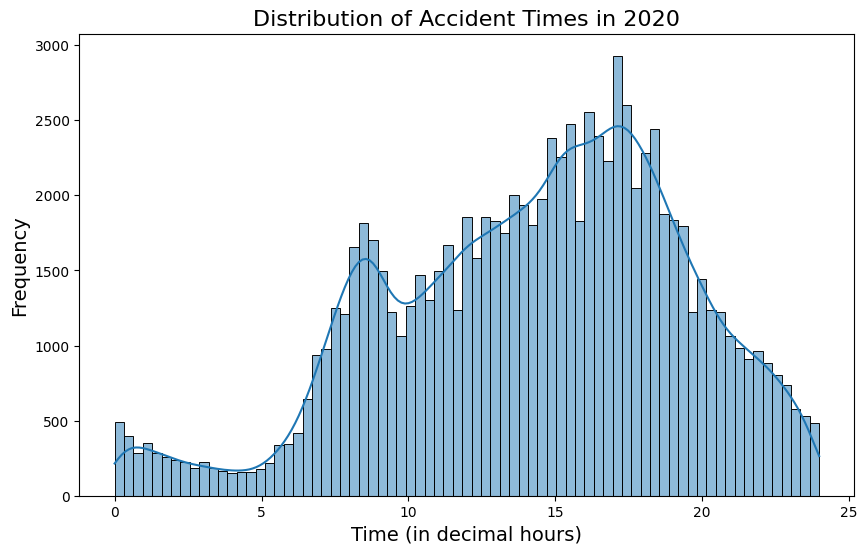

In [48]:
# Set the size of the plot
plt.figure(figsize=(10, 6))

# Create the histogram plot with KDE (Kernel Density Estimation)
sns.histplot(accident_df['decimal_time'], kde=True)

# Adding labels and a title
plt.xlabel('Time (in decimal hours)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.title('Distribution of Accident Times in 2020', fontsize=16)


# Save the plot as a PNG file
plt.savefig('accident_decimal_times_distribution_2020.png')

# Display the plot
plt.show()


In [49]:
accident_df['decimal_time'].value_counts().head(10)

17.0    862
16.0    785
15.0    774
17.5    746
18.0    739
14.0    699
16.5    697
15.5    697
18.5    629
13.0    605
Name: decimal_time, dtype: int64

### Converting just to the hour method

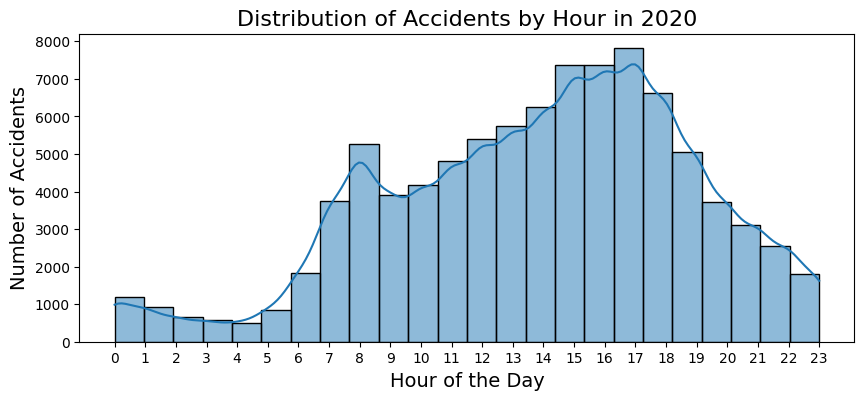

In [50]:
# Convert the 'time' column to a pandas datetime object
accident_df['time'] = pd.to_datetime(accident_df['time'])

# Extract the hour from the time
accident_df['hour'] = accident_df['time'].dt.hour

# Set the size of the plot
plt.figure(figsize=(10, 4))

# Create the histogram plot using seaborn, I added Kde to understand the distribution of the data
sns.histplot(data=accident_df, x='hour', bins=24, kde=True)

# Adding labels and a title
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Number of Accidents', fontsize=14)
plt.title('Distribution of Accidents by Hour in 2020', fontsize=16)
plt.xticks(range(24))

# Save the plot as a PNG file
plt.savefig('accidents_by_hour_2020.png')

# Display the plot
plt.show()


In [51]:
# 10 most common hours of the day accidents occur
accident_df['hour'].value_counts().head(10)


17    7813
16    7381
15    7361
18    6618
14    6245
13    5741
12    5395
8     5267
19    5048
11    4812
Name: hour, dtype: int64

The analysis of both 'hour' and 'decimal_time' indicates that certain times of the day are significantly more probable to result in an accident.

Examining the data by full hours, the highest number of accidents was reported at 17:00 (5:00 PM), totaling 7,813 occurrences. The following hours, 16:00 (4:00 PM) and 15:00 (3:00 PM), also witnessed a significant number of accidents, tallying 7,381 and 7,361 respectively. This pattern strongly points to the late afternoon and early evening period, coinciding with the conclusion of a typical workday and potential rush hours, as the peak times for accidents. 

When considering the half-hour intervals represented in the 'decimal_time' data, the trend remains consistent. At 17.0 hours (5:00 PM), the maximum number of accidents were recorded, summing up to 862. Other notable times, including 16.0 (4:00 PM), 15.0 (3:00 PM), and 17.5 (5:30 PM), also displayed high counts of accidents, recording 785, 774, and 746 incidents correspondingly.

## Day of the week accidents occur

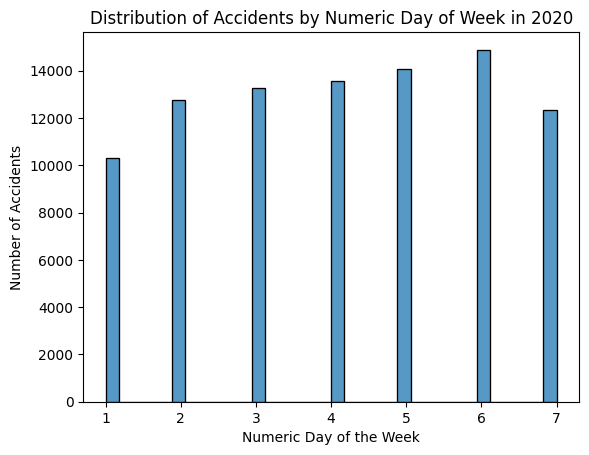

In [52]:
# Quick visualisation of the column 
sns.histplot(accident_df['day_of_week'])
plt.xlabel('Numeric Day of the Week') # Set the x-axis label
plt.ylabel('Number of Accidents') # Set the y-axis label
plt.title('Distribution of Accidents by Numeric Day of Week in 2020') # Set the title
plt.savefig('numeric_accidents_by_day_2020.png') # Save the plot as a PNG file
plt.show() # Display the plot

In [53]:
# Counts of occurrences of each accident in the 'day_of_week' column
accident_df['day_of_week'].value_counts()

6    14889
5    14056
4    13564
3    13267
2    12772
7    12336
1    10315
Name: day_of_week, dtype: int64

**Based on the Stat19 form, each day of the week is represented by an integer between 1 and 7, starting with Sunday and ending on Saturday. I will convert the date column to pandas datetime using pandas function (pd.to_datetime). This will enable to me to easily extract the year, month, day, or even the day of the week from the 'date' column, which can provide valuable insights for this analysis.** 

In [54]:
# Converting the 'date' column of the DataFrame 'accident_df' to a datetime object
try:
    # The 'pd.to_datetime' method is used to perform the conversion
    # dayfirst=True' indicates that the day is the first element in the date string
    accident_df['date'] = pd.to_datetime(accident_df['date'], dayfirst=True, format='%d/%m/%Y')
    print('Date conversion is successful') # Success message if the conversion is successful
except Exception as err:
    # Print an error message if any exception occurs during the conversion
    print(f'An error occurred during date conversion: {err}')


Date conversion is successful


In [55]:
''' 
Filtering the day of the week from the 'date' column in the 'accident_df' DataFrame
The 'dt.day_name()' method is for getting the name of the day (e.g., 'Monday', 'Tuesday', etc.)
'''
accident_df['day'] = accident_df['date'].dt.day_name()

# This will provide a summary of how many accidents occurred on each day of the week
accident_df['day'].value_counts()


Friday       14889
Thursday     14056
Wednesday    13564
Tuesday      13267
Monday       12772
Saturday     12336
Sunday       10315
Name: day, dtype: int64

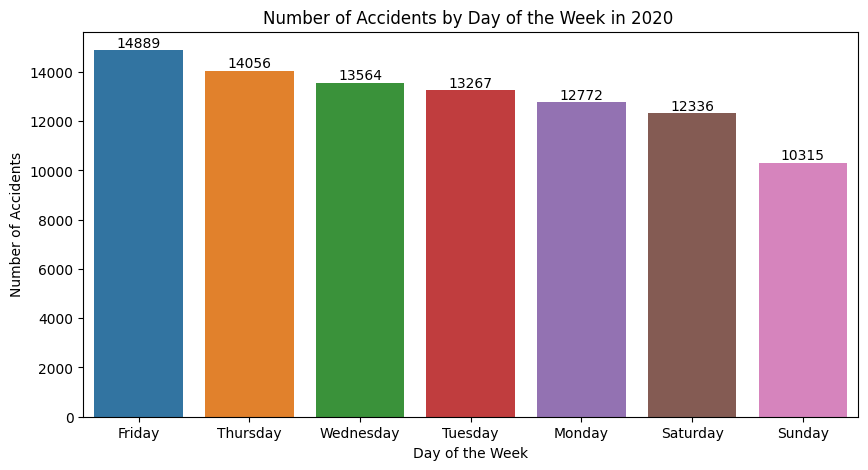

In [56]:
# Creating a function that will plot categorical column in the dataset
def accidents_plot_day_month(df, column='day', title_suffix='', save_suffix=''):
    '''
    Plot the number of accidents based on the provided day column.

    Parameters:
    - df: DataFrame containing the accident data.
    - column: The column name in the dataframe by which accidents should be grouped by day. 
      Default is 'day'.
    - While the title_suffix is a string that will be appended to the title of the plot.
    - And the save_suffix is a string that will be appended to the saved file name.
    '''

    # Count accidents based on the specified column
    counts = df[column].value_counts()

    # Create the bar plot using Seaborn
    plt.figure(figsize=(10, 5))
    plot = sns.barplot(x=counts.index, y=counts.values)

    # Adjusting labels
    if column == 'day':
        xlabel = 'Day of the Week'
        title = 'Number of Accidents by Day of the Week in 2020'
        save_path = f'accidents_by_day_{save_suffix}.png'  # File path to save the plot
    else:
        xlabel = 'Month'
        title = 'Number of Accidents by Month in 2020'
        save_path = f'accidents_by_month_{save_suffix}.png'
        plt.xticks(rotation=45) # Rotating the x-labels for better fits
    
    plt.xlabel(xlabel)
    plt.title(title + ' ' + title_suffix)

    # Adding value counts above the bars
    for p in plot.patches:
        plot.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                      ha='center', va='center', xytext=(0, 5), textcoords='offset points')

    plt.ylabel('Number of Accidents')
    plt.savefig(save_path)  # Saving the plot to the specified file path
    plt.show()

# Plot for days of the week
accidents_plot_day_month(accident_df, column='day')


The frequency of accidents was found to be highest on Friday, amounting to a total of 14,889 incidents. This number gradually decreases throughout the start of the week, reaching 12,772 accidents by Monday. Interestingly, Saturday (the weekend) logged more accidents (12,336) compared to Sunday, which recorded the week's lowest at 10,315 accidents.

This analysis suggests that accident rates are most prevalent towards the tail end of the workweek, with Friday topping the list in terms of incident counts. Conversely, Sunday (the begining of the week) registered the least number of accidents during the week.

### The Month most accidents occur

In [57]:
'''
Filtering the name of the month from the 'date' column in the 'accident_df' DataFrame
The 'dt.month_name()' method will get the full name of the month (e.g., 'January', 'February', etc.)
'''
accident_df['month'] = accident_df['date'].dt.month_name()

# This will provide a summary of how many accidents occurred in each month of the year
accident_df['month'].value_counts()

January      9591
September    9258
August       8875
October      8865
February     8546
July         8157
December     8128
November     7610
June         6721
March        6551
May          5599
April        3298
Name: month, dtype: int64

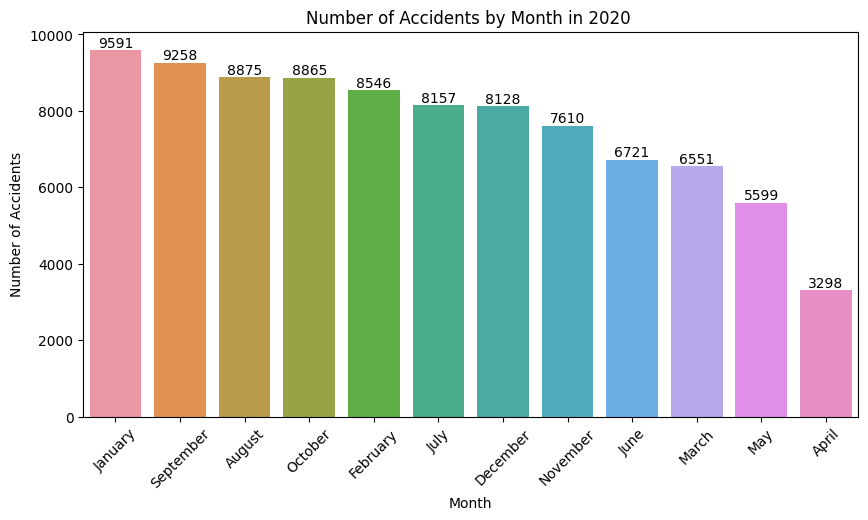

In [58]:
# Calling the funtion above for the month column
accidents_plot_day_month(accident_df, column='month') 

During the year, the distribution of accidents varied across months. January experienced the highest incidence of accidents with 9,591 cases, closely followed by September with 9,258. The summer months of August and July reported 8,875 and 8,157 accidents respectively, while October had a similar count at 8,865. Meanwhile, the early spring months, particularly April, witnessed a significant drop with only 3,298 accidents. In contrast, mid-year months like June and May had 6,721 and 5,599 incidents, respectively. The year ended with December recording 8,128 accidents than that of the previous month, November, which was 7610 accidents.

### The impact  of the weather conditions, light conditions, road surface conditions, road type, speed limit and urban or rural area on the significant  hours of the day on accidents mostly occur 

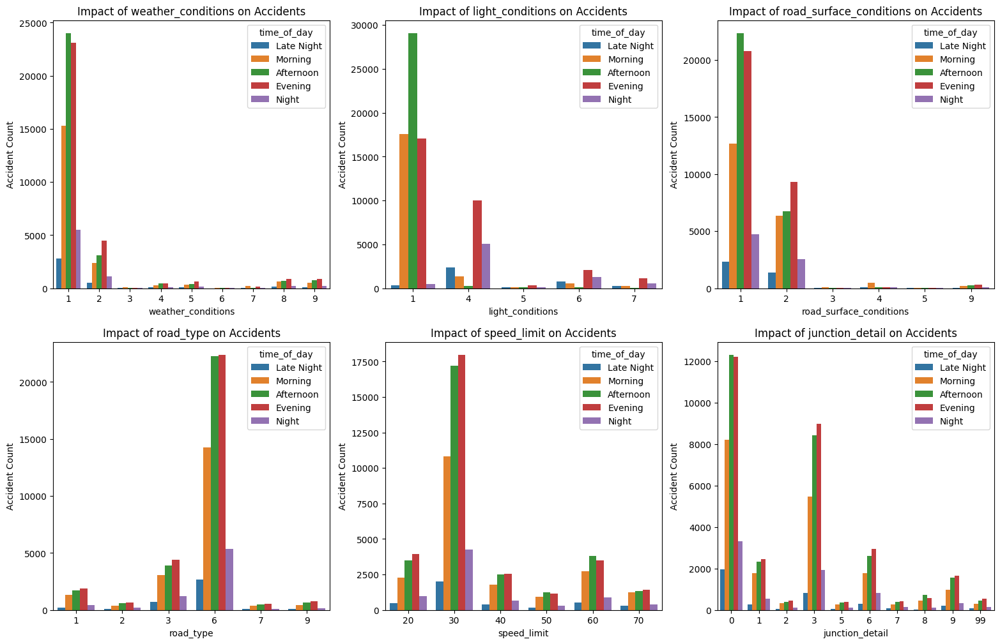

In [187]:
# Creating a function to visualise the effect of the selected columns on the number of accidents by hour

def col_impact_on_hourly_acc(df, hour_column='hour', filename='conditional_impact_on_accidents.png'):
    # Define the bin edges for the time periods
    bins = [0, 5, 11, 16, 21, 24]
    
    # Define the labels for the corresponding time periods
    labelings = ['Late Night', 'Morning', 'Afternoon', 'Evening', 'Night']
    
    # Categorizing the hours into the defined time periods and create a new column 'time_of_day'
    df['time_of_day'] = pd.cut(df[hour_column], bins=bins, labels=labelings, right=False)

    # Define the columns to be analyzed
    columns = ['weather_conditions', 'light_conditions', 'road_surface_conditions', 'road_type', 'speed_limit', 'junction_detail']

    # Create a figure and axes for the subplots (2 rows, 3 columns)
    fig, axes = plt.subplots(2, 3, figsize=(19, 12))

    try:
        # Iterate through the columns and create a barplot for each
        for index, col in enumerate(columns):
            # Determine the row and column in the grid for the current plot
            row = index // 3
            col_idx = index % 3
            
            # Group by the variable and time period, then count the number of accidents
            grouped_data = df.groupby([col, 'time_of_day']).size().reset_index(name='accident_count')
            
            # Create a barplot on the current subplot
            sns.barplot(x=col, y='accident_count', hue='time_of_day', data=grouped_data, palette='tab10', ax=axes[row, col_idx])

            # Set the labels and title for the plot
            axes[row, col_idx].set_xlabel(col)
            axes[row, col_idx].set_ylabel('Accident Count')
            axes[row, col_idx].set_title(f'Impact of {col} on Accidents')

        # Show the plot
        plt.show()
        
        # Save the plot as a file in the working directory
        fig.savefig(filename, figsize = 30) # I set figsize to 30, to make it visible in my report
        
    except KeyError as err:
        print(f"A KeyError occurred: {err}. Please ensure the DataFrame has the expected columns.")
    except TypeError as err:
        print(f"A TypeError occurred: {err}. Check the data types in the DataFrame.")

# Calling the function
col_impact_on_hourly_acc(accident_df)


In [60]:
# Define the columns to be analyzed
columns = ['weather_conditions', 'light_conditions', 'road_surface_conditions', 'road_type', 'speed_limit', 'junction_detail']

# Using a list comprehension, group the DataFrame by the time periods and each specified column, and count the occurrences
value_counts_list = [accident_df.groupby(['time_of_day', col]).size().reset_index(name='count') for col in columns]

# Print the value counts for each specified column without the index
for value_counts, col in zip(value_counts_list, columns):
    print(f"Value counts for {col}:")
    print(value_counts.to_string(index=False))
    print()


Value counts for weather_conditions:
time_of_day  weather_conditions  count
 Late Night                   1   2794
 Late Night                   2    532
 Late Night                   3     11
 Late Night                   4     69
 Late Night                   5    122
 Late Night                   6      4
 Late Night                   7     60
 Late Night                   8    128
 Late Night                   9    115
    Morning                   1  15315
    Morning                   2   2385
    Morning                   3     87
    Morning                   4    291
    Morning                   5    325
    Morning                   6     23
    Morning                   7    197
    Morning                   8    645
    Morning                   9    510
  Afternoon                   1  24025
  Afternoon                   2   3074
  Afternoon                   3     43
  Afternoon                   4    461
  Afternoon                   5    408
  Afternoon                

#### WEATHER CONDITION CODE MEANING

**1**    Fine without high winds

**2**    Raining without high winds

**3**    Snowing without high winds

**4**    Fine with high winds

**5**    Raining with high winds

**6**    Snowing with high winds

**7**    Fog or mist — if hazard

**8**    Other

**9**    Unknown

#### LIGHT CONDITION CODE MEANING
**1**    Daylight:

**4**    Darkness: street lights present and lit

**5**    Darkness: street lights present but unlit

**6**    Darkness: no street lighting

**7**    Darkness: street lighting unknown 


#### ROAD SURFACE CONDITION CODE MEANING
**1**    Dry

**2**    Wet / Damp

**3**    Snow

**4**    Frost / Ice 

**5**    Flood (surface water over 3cm deep)

#### ROAD TYPE CODE MEANING
**1**    Roundabout

**2**    One way street 

**3**    Dual carriageway

**6**   Single carriageway

**7**    Slip road

**9**    Unknown

#### JUNCTION DETAIL CODE MEANING
**00**   Not at or within 20 metres of junction

**01**    Roundabout

**02**    Mini roundabout

**03**    T or staggered junction

**05**    Slip road

**06**   Crossroads

**07**   Junction more than four arms (not RAB)

**08**    Using private drive or entrance 

**09**    Other junction



The plots analyze the influence of various conditions such as weather, light, road surface, road type, speed limit, and junction detail on the number of reported hourly accidents, which has been grouped in time-periods. The analysis is derived from aggregated data and aims to understand the prevailing circumstances that might contribute to the occurrence of accidents.

**Weather Conditions:**
Fine weather without high winds marked as 1 is the most commonly reported weather condition accidents occur, indicating that weather might not be a predominant cause of accidents. This is followed by Raining without high winds marked as 2. 
One would think better weather usually leads to clear visibility, potentially contributing to fewer accidents. However, this is not the case, could it be due to complancency? Further analysis would provide a complete understanding of weather-related risks.

**Light Conditions:**

Accidents are more prevalent in Daylight (code 1), this is not surprising as 15:00, 16:00 and 17:00 are the significant hours with the highest number of occurrences.

**Road Surface Conditions:**
The prevalence of accidents on dry surfaces highlights the role of other factors such as human error, road design, or vehicle conditions. Wet/Damp road types follow, according to https://www.researchgate.net/publication/275221033_Effect_of_Rainfall_and_Wet_Road_Condition_on_Road_Crashes_A_Critical_Analysis Wet and damp conditions increase the likelihood of skidding and accidents.

**Road Type:**

The high incidence of accidents on single carriageways across all times of the day underscores the need for safety measures specific to this road type. The evaluation suggests that  single carriageway road type affects the high number of recorded accidents. This is followed by Dual carriageway. https://www.telegraph.co.uk/news/uknews/road-and-rail-transport/10400682/Single-carriageway-roads-seven-times-more-dangerous-than-motorways.html

**Speed Limit:**

Most accidents occur at 30 speed limit across all times of the day. This could be as a result of the road type especially in areas with higher pedestrian activity.

**Junction Detail:**
A significant number of accidents occured not near junctions suggests straight road mishaps due to factors like speed or distractions. T or staggered junctions come next, emphasizing the complexity of these intersections.


### TASK 2

### For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur? We suggest a focus on: Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.

In [61]:
vehicle_df['vehicle_type'].unique() # checking the unique entries of the vehicle type

array([ 9,  8,  3,  2, 11,  1, 90, 19,  4,  5, 21, 97, 20, 98, 10, 17, 23,
       22, 18, 16], dtype=int64)

### TYPE OF VEHICLE CODES

01. Pedal cycle

02. Motorcycle 50cc and under

**03. Motorcycle over 50cc and up to 125cc**

**04. Motorcycle over 125cc and up to 500cc**

**05. Motorcycle over 500cc**

97. Motorcycle – unknown cc

23. Electric motorcycle

08. Taxi/Private hire car

09. Car

10. Minibus (8 - 16 passenger seats)

11. Bus or coach (17 or more passenger seats)

16. Ridden horse

17. Agricultural vehicle (includes diggers etc.)

18. Tram/Light rail

19. Van/Goods vehicle 3.5 tonnes maximum gross weight (mgw) and under

20. Goods vehicle over 3.5 tonnes and under 7.5 tonnes mgw

21. Goods vehicle 7.5 tonnes mgw and over

98. Goods vehicle – unknown weight

22. Mobility scooter

90. Other vehicle

In [62]:
# Confirm the unique entries of vehicle_type
vehicle_df.vehicle_type.unique()

array([ 9,  8,  3,  2, 11,  1, 90, 19,  4,  5, 21, 97, 20, 98, 10, 17, 23,
       22, 18, 16], dtype=int64)

In [63]:
# Adding these columns from the accident dataframe, they will be used for this section's analysis

vehicle_df[['day', 'month']] = accident_df[['day', 'month']]

In [64]:
vehicle_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167375 entries, 0 to 167374
Data columns (total 30 columns):
 #   Column                            Non-Null Count   Dtype 
---  ------                            --------------   ----- 
 0   vehicle_index                     167375 non-null  int64 
 1   accident_year                     167375 non-null  int64 
 2   vehicle_reference                 167375 non-null  int64 
 3   vehicle_type                      167375 non-null  int64 
 4   towing_and_articulation           167375 non-null  Int64 
 5   vehicle_manoeuvre                 167375 non-null  Int64 
 6   vehicle_direction_from            167375 non-null  Int64 
 7   vehicle_direction_to              167375 non-null  Int64 
 8   vehicle_location_restricted_lane  167375 non-null  Int64 
 9   junction_location                 167375 non-null  Int64 
 10  skidding_and_overturning          167375 non-null  Int64 
 11  hit_object_in_carriageway         167375 non-null  Int64 
 12  ve

In [65]:
sub_veh_df = vehicle_df[['vehicle_type', 'accident_index']]
sub_veh_df.head()

,vehicle_type,accident_index
0,9,2020010219808
1,9,2020010220496
2,9,2020010228005
3,8,2020010228006
4,9,2020010228011


In [66]:
sub_veh_df.shape # Checking the shape (rows and columns) of the dataframe

(167375, 2)

In [67]:
sub_veh_df.duplicated().sum() # Checking for duplicates

38072

In [68]:
'''
Dropping duplicates from this dataframe is essential for several reasons. Duplicates can compromise data integrity, 
skew statistical analyses and will negatively impact the performance of my analysis. Removing them ensures each 
entry is unique and enhances the accuracy of the analysis.
'''

# Dropping duplicates for accurate analysis and updating the DataFrame
sub_veh_df = sub_veh_df.drop_duplicates(subset=['accident_index'], keep='first')

In [69]:
sub_veh_df.head() #The dataframe after dropping the duplicates

,vehicle_type,accident_index
0,9,2020010219808
1,9,2020010220496
2,9,2020010228005
3,8,2020010228006
4,9,2020010228011


In [70]:
vehicle_type_category = [3,4,5] # Area of focus
sub_veh_df = sub_veh_df[sub_veh_df['vehicle_type'].isin(vehicle_type_category)]


In [71]:
sub_veh_df.sample(6)

,vehicle_type,accident_index
42684,3,2020040982510
155451,3,2020552001209
119311,4,2020430397188
20317,3,2020010260306
30806,5,2020010275481
113939,3,2020420999295


In [72]:
sub_veh_df.shape #Now the current shape

(7660, 2)

In [73]:
# Merge the needed accident and vehicle data
acc_veh_df = pd.merge(sub_veh_df, accident_df, on = 'accident_index')
acc_veh_df.head()

,vehicle_type,accident_index,accident_year,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,time,local_authority_ons_district,local_authority_highway,lsoa_of_accident_location,converted_time,decimal_time,hour,day,month,time_of_day
0,3,2020010228020,2020,529718,192342,-0.127840,51.614971,1,3,2,...,2023-08-14 03:25:00,E09000010,E09000010,E01001530,2023-08-14 03:25:00,3.416667,3,Wednesday,January,Late Night
1,3,2020010228086,2020,531043,176304,-0.114680,51.470537,1,3,1,...,2023-08-14 14:00:00,E09000022,E09000022,E01003186,2023-08-14 14:00:00,14.000000,14,Wednesday,January,Afternoon
2,3,2020010228148,2020,518467,185248,-0.292651,51.553691,1,3,1,...,2023-08-14 19:05:00,E09000005,E09000005,E01000635,2023-08-14 19:05:00,19.083333,19,Wednesday,January,Evening
3,3,2020010228207,2020,527038,170583,-0.174362,51.420033,1,3,2,...,2023-08-14 14:29:00,E09000024,E09000024,E01003371,2023-08-14 14:29:00,14.483333,14,Wednesday,January,Afternoon
4,3,2020010228240,2020,534659,178273,-0.061900,51.487383,1,3,2,...,2023-08-14 13:20:00,E09000028,E09000028,E01004038,2023-08-14 13:20:00,13.333333,13,Thursday,January,Afternoon


In [74]:
acc_veh_df.shape

(7660, 43)

In [75]:
acc_veh_df.columns

Index(['vehicle_type', 'accident_index', 'accident_year',
       'location_easting_osgr', 'location_northing_osgr', 'longitude',
       'latitude', 'police_force', 'accident_severity', 'number_of_vehicles',
       'number_of_casualties', 'day_of_week', 'local_authority_district',
       'first_road_class', 'first_road_number', 'road_type', 'speed_limit',
       'junction_detail', 'junction_control', 'second_road_class',
       'second_road_number', 'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag', 'accident_reference', 'date', 'time',
       'local_authority_ons_district', 'local_authority_highway',
       'lsoa_of_accident_location', 'converted_time', 'decimal_time', 'hour',
       'day', 'month', 'time_of_day'],


## Motorbikes accidents significant hours of the day

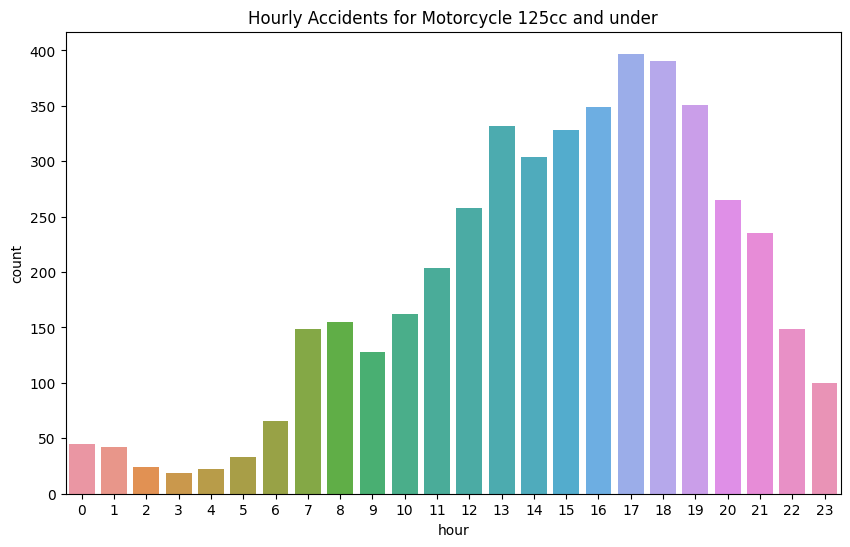

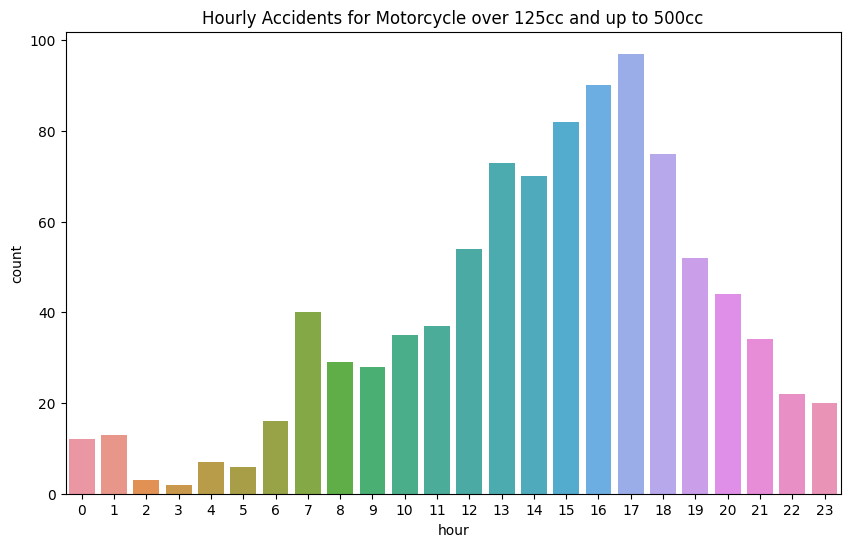

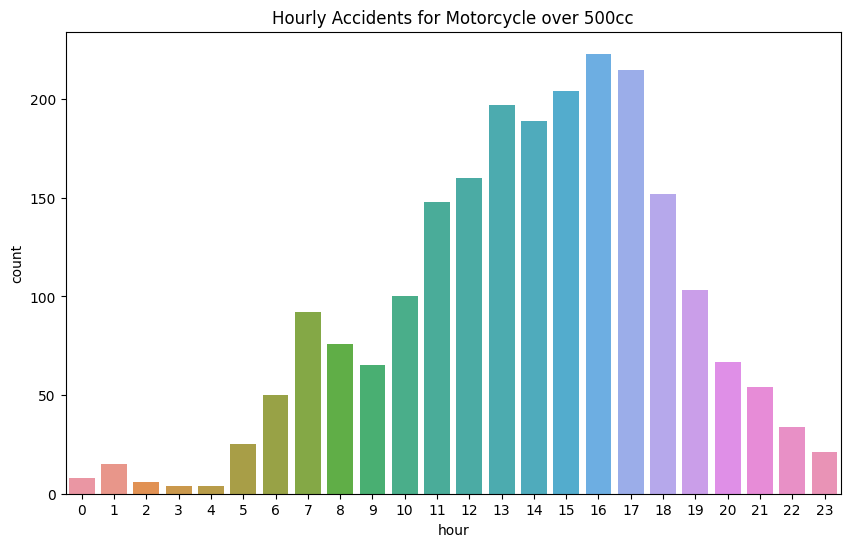

In [76]:
def plot_motorbike_accidents_by_hour(df, vehicle_type_categories):
    # Iterate through the given vehicle type categories
    for vehicle_type in vehicle_type_categories:
        # Create a new figure with specific size
        plt.figure(figsize=(10, 6))
        # Create a countplot of accidents by hour for the specific vehicle type
        sns.countplot(x='hour', data=df[df['vehicle_type'] == vehicle_type])

        # Define the titles for the known vehicle types
        titles = {
            3: 'Motorcycle 125cc and under',
            4: 'Motorcycle over 125cc and up to 500cc',
            5: 'Motorcycle over 500cc',
        }

        # Set the title for the plot using the corresponding title for the vehicle type
        plt.title('Hourly Accidents for ' + titles[vehicle_type])
        # Save the plot to the working directory
        plt.savefig('hourly_accidents_' + titles[vehicle_type].replace(' ', '_') + '.png')
        # Display the plot
        plt.show()
# Call the defined function with the DataFrame and vehicle type categories
plot_motorbike_accidents_by_hour(acc_veh_df, vehicle_type_category)

In [77]:
# Grouping by 'vehicle_type' and getting value counts for the 'hour' column for each category
motorbike_hour_counts3 = acc_veh_df[acc_veh_df['vehicle_type']== 3].groupby('vehicle_type')['hour'].value_counts().sort_index()
motorbike_hour_counts4 = acc_veh_df[acc_veh_df['vehicle_type']== 4].groupby('vehicle_type')['hour'].value_counts().sort_index()
motorbike_hour_counts5 = acc_veh_df[acc_veh_df['vehicle_type']== 5].groupby('vehicle_type')['hour'].value_counts().sort_index()

# Print the results
print(motorbike_hour_counts3)
print(motorbike_hour_counts4)
print(motorbike_hour_counts5)

vehicle_type  hour
3             0        45
              1        42
              2        24
              3        19
              4        22
              5        33
              6        66
              7       149
              8       155
              9       128
              10      162
              11      204
              12      258
              13      332
              14      304
              15      328
              16      349
              17      397
              18      390
              19      351
              20      265
              21      235
              22      149
              23      100
Name: hour, dtype: int64
vehicle_type  hour
4             0       12
              1       13
              2        3
              3        2
              4        7
              5        6
              6       16
              7       40
              8       29
              9       28
              10      35
              11      37
             

**Motorcycles with Engine Size 125cc or Less (Category 3)**
For this motorcycle category, the pattern of accidents reveals a spike during the transition from late afternoon to early evening. Specifically, the numbers peak at 5 PM, recording 397 incidents, and at 6 PM with 390 incidents. Starting from 10 AM, the frequency of accidents begins to rise, maintaining a consistent level throughout the afternoon. The early hours between 2 AM and 5 AM witness the fewest accidents.

**Motorcycles with Engine Size Over 125cc but Not Exceeding 500cc (Category 4)**
Motorcycles falling within this engine size range experience a notable number of accidents during the afternoon hours. The data indicates a key window from 3 PM (82 accidents) to 5 PM (97 accidents) where incidents are more common. The pattern aligns with the previous category, with fewer occurrences in the early morning and a gradual increase that persists into the late afternoon.

**Motorcycles with Engine Size Above 500cc (Category 5)**
For these larger motorcycles, the data also signals heightened accident rates at 4 PM (223 incidents) and 5 PM (215 incidents). TThe pattern becomes more pronounced during the morning rush hours, commencing at 6 AM, and tails off towards the early morning, especially in the time frame from midnight to 4 AM.

#### CHECKING THE WHEN, WHERE, AND UNDER WHAT CONDITIONS THE MOTORBIKES ACCIDENTS HAPPENED



Visualisations for Motorcycle 125cc and under:
*********************************************


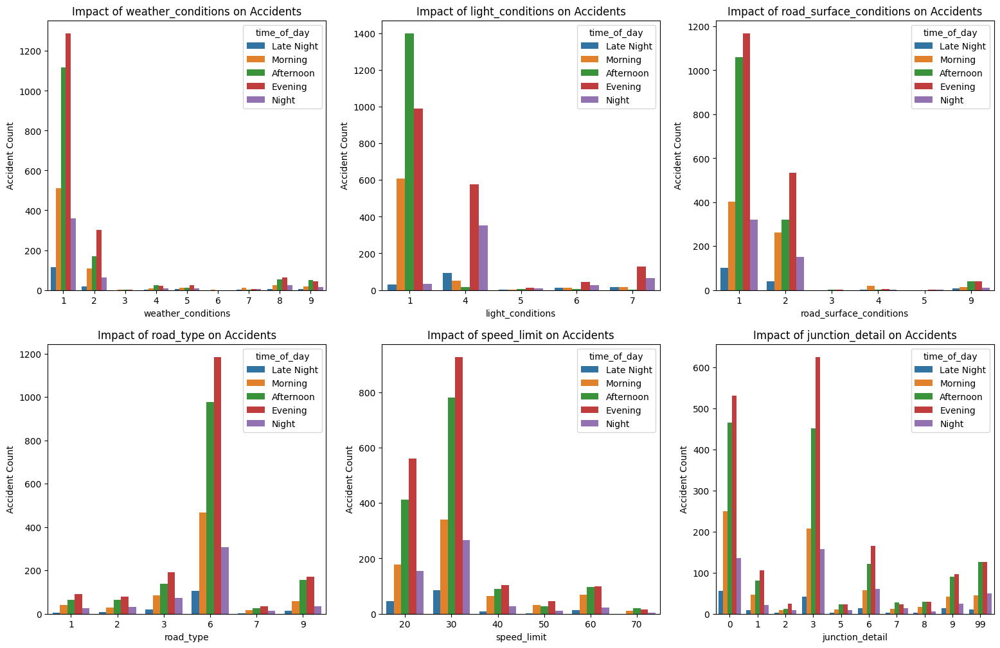



Visualisations for Motorcycle over 125cc and up to 500cc:
*********************************************


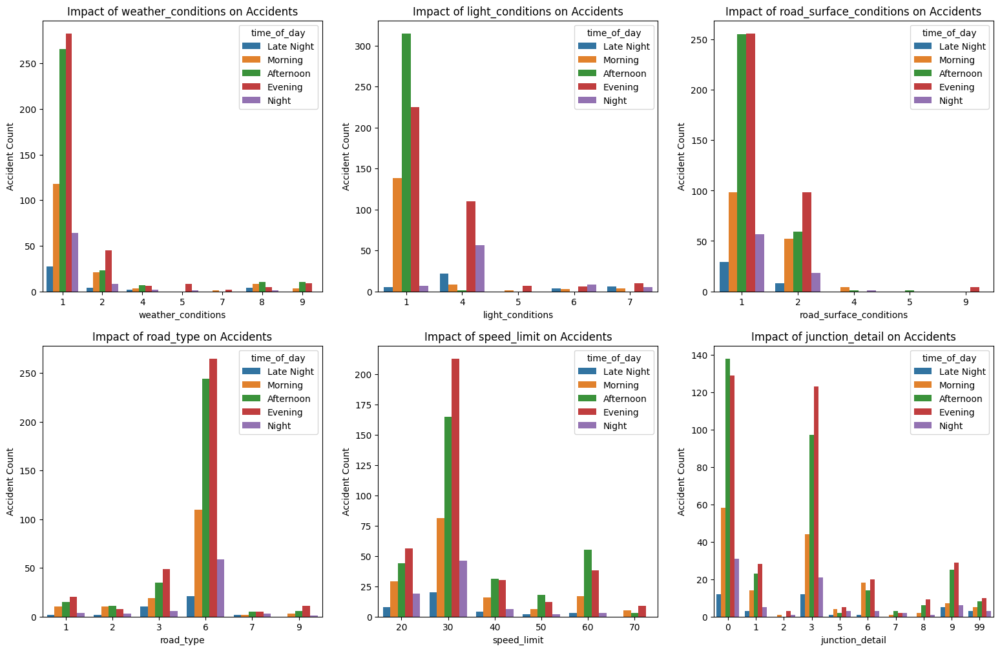



Visualisations for Motorcycle over 500cc:
*********************************************


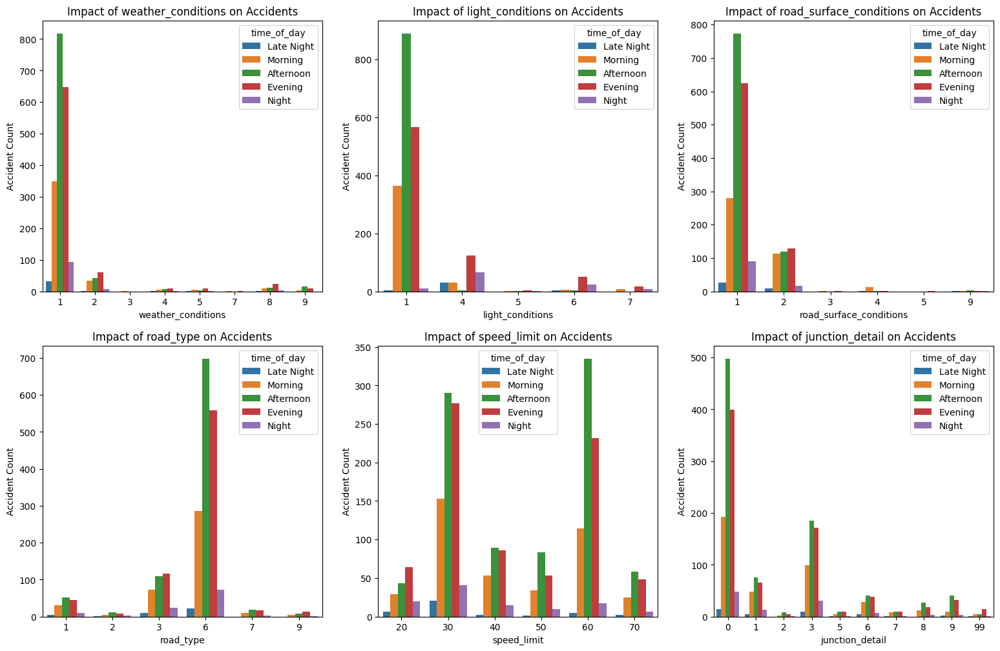

In [188]:
# Calling the function I defined earlier to visualise the different conditions for the motorbikes
vehicle_type_category = [3, 4, 5]
titles = {
    3: 'Motorcycle 125cc and under',
    4: 'Motorcycle over 125cc and up to 500cc',
    5: 'Motorcycle over 500cc',
}

for vehicle_type in vehicle_type_category:
    filtered_df = acc_veh_df[acc_veh_df['vehicle_type'] == vehicle_type]
    
    # Print the heading for the vehicle type
    print(f"\n\nVisualisations for {titles[vehicle_type]}:\n" + "*"*45)

    # Construct a unique filename based on the vehicle type
    filename = f'conditional_impact_on_accidents_of_vehicletype_{vehicle_type}.png'
    
    # Call the function with the filtered DataFrame and unique filename
    col_impact_on_hourly_acc(filtered_df, filename=filename)


#### WEATHER CONDITION CODE MEANING

**1**    Fine without high winds

**2**    Raining without high winds

**3**    Snowing without high winds

**4**    Fine with high winds

**5**    Raining with high winds

**6**    Snowing with high winds

**7**    Fog or mist — if hazard

**8**    Other

**9**    Unknown

#### LIGHT CONDITION CODE MEANING
**1**    Daylight:

**4**    Darkness: street lights present and lit

**5**    Darkness: street lights present but unlit

**6**    Darkness: no street lighting

**7**    Darkness: street lighting unknown 


#### ROAD SURFACE CONDITION CODE MEANING
**1**    Dry

**2**    Wet / Damp

**3**    Snow

**4**    Frost / Ice 

**5**    Flood (surface water over 3cm deep)

#### ROAD TYPE CODE MEANING
**1**    Roundabout

**2**    One way street 

**3**    Dual carriageway

**6**   Single carriageway

**7**    Slip road

**9**    Unknown

#### JUNCTION DETAIL CODE MEANING
**00**   Not at or within 20 metres of junction

**01**    Roundabout

**02**    Mini roundabout

**03**    T or staggered junction

**05**    Slip road

**06**   Crossroads

**07**   Junction more than four arms (not RAB)

**08**    Using private drive or entrance 

**09**    Other junction



According to the analysis on the factors influencing motorbike accidents for **Motorcycles 125cc and under**, several key observations were made. Interestingly, adverse weather conditions did not significantly contribute to the accidents, as the majority of incidents occurred during clear, fine weather without high winds across all time periods.

Contrary to common assumptions, darkness played a minimal role in the number of accidents for this category of vehicle, as the majority of the recorded accidents happened during daylight. Moreover, the condition of the road surface was found to be less influential on accident rates for this type of motorbike; dry road surface conditions accounted for more accidents across all periods of the day compared to wet/damp or other hazardous road surface conditions.

Of particular note, the type of road and speed limits were identified as vital factors in accident occurrences. More accidents were recorded on Single carriageway roads and most accidents occured under medium speed limits, specifically in zones marked with speed limits of 30 and 20 mph.

Finally, the analysis revealed that junction details significantly influenced the recorded incidents, with T or staggered junctions being associated with more accidents compared to locations not at or within 20 meters of a junction.

According to the analysis of accidents for **Motorcycles over 125cc and up to 500cc**, weather and road surface conditions were found to have an insignificant impact on accidents. Most accidents occurred during fine weather and on dry roads. Darkness had minimal effect, with most incidents happening during daylight or with street lights lit. Most accidents were recorded on Single carriageway roads and in areas with 30 mph speed limits. Junction details, particularly T or staggered junctions, also played a role in accidents. The findings highlight the importance of road design, speed limits, and junction configurations, while de-emphasizing the influence of weather or lighting conditions on accidents for this motorbike category.

Based on the analysis for conditions affecting motorcycle accidents for **Motorcycles over 500cc**, the key observations highlight the inconsiderable impact of bad weather, as most accidents occurred during fine weather without high winds. Darkness also had a minimal effect, with the majority of accidents happening in daylight. Risky road surface conditions played no major role, as dry roads saw more accidents across all times of day than wet/damp or other adverse road conditions. The type of road and speed limits were significant factors, with more accidents on Single carriageway roads and in areas with medium and high-speed limits (30 and 60). While more accidents occurred in areas not at or within 20 meters of junctions, junction details, particularly T or staggered junctions, still contributed to hundreds of accidents, especially during the morning, afternoon, and evening.

In [79]:
vehicle_type_categories = [3, 4, 5]
columns = ['weather_conditions', 'light_conditions', 'road_surface_conditions', 'road_type', 'speed_limit', 'junction_detail']

for vehicle_type in vehicle_type_categories:
    print(f"Vehicle Type {vehicle_type}:")
    for col in columns:
        print(f"\nGrouping by {col}:")
        grouped_data = acc_veh_df[acc_veh_df['vehicle_type'] == vehicle_type].groupby([col, 'time_of_day']).size()
        print(grouped_data)
    print("\n" + "="*50 + "\n")


Vehicle Type 3:

Grouping by weather_conditions:
weather_conditions  time_of_day
1                   Late Night      116
                    Morning         512
                    Afternoon      1116
                    Evening        1289
                    Night           359
2                   Late Night       18
                    Morning         108
                    Afternoon       169
                    Evening         301
                    Night            63
3                   Late Night        0
                    Morning           1
                    Afternoon         2
                    Evening           2
                    Night             0
4                   Late Night        3
                    Morning           7
                    Afternoon        24
                    Evening          22
                    Night             9
5                   Late Night        4
                    Morning          11
                    Afternoon        13

junction_detail  time_of_day
0                Late Night      12
                 Morning         58
                 Afternoon      138
                 Evening        129
                 Night           31
1                Late Night       3
                 Morning         14
                 Afternoon       23
                 Evening         28
                 Night            5
2                Late Night       0
                 Morning          1
                 Afternoon        0
                 Evening          3
                 Night            1
3                Late Night      12
                 Morning         44
                 Afternoon       97
                 Evening        123
                 Night           21
5                Late Night       1
                 Morning          4
                 Afternoon        2
                 Evening          5
                 Night            3
6                Late Night       1
                 Morning         18

## Motorbikes significant days of the week

In [80]:
acc_veh_df.columns

Index(['vehicle_type', 'accident_index', 'accident_year',
       'location_easting_osgr', 'location_northing_osgr', 'longitude',
       'latitude', 'police_force', 'accident_severity', 'number_of_vehicles',
       'number_of_casualties', 'day_of_week', 'local_authority_district',
       'first_road_class', 'first_road_number', 'road_type', 'speed_limit',
       'junction_detail', 'junction_control', 'second_road_class',
       'second_road_number', 'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag', 'accident_reference', 'date', 'time',
       'local_authority_ons_district', 'local_authority_highway',
       'lsoa_of_accident_location', 'converted_time', 'decimal_time', 'hour',
       'day', 'month', 'time_of_day'],


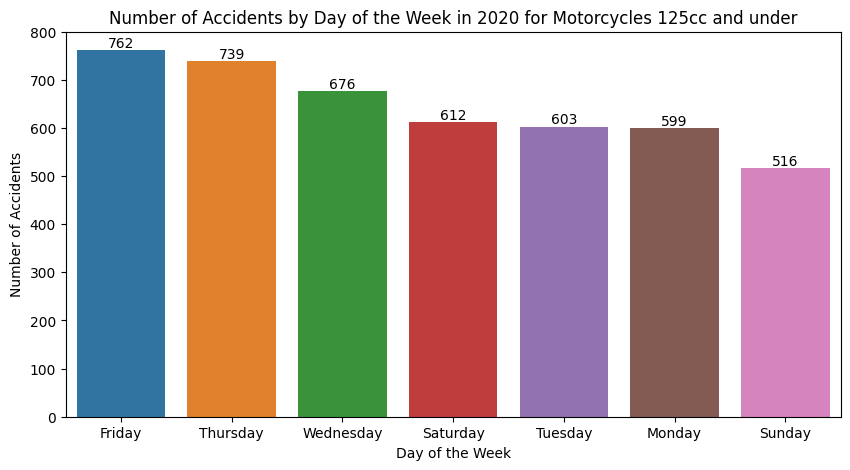

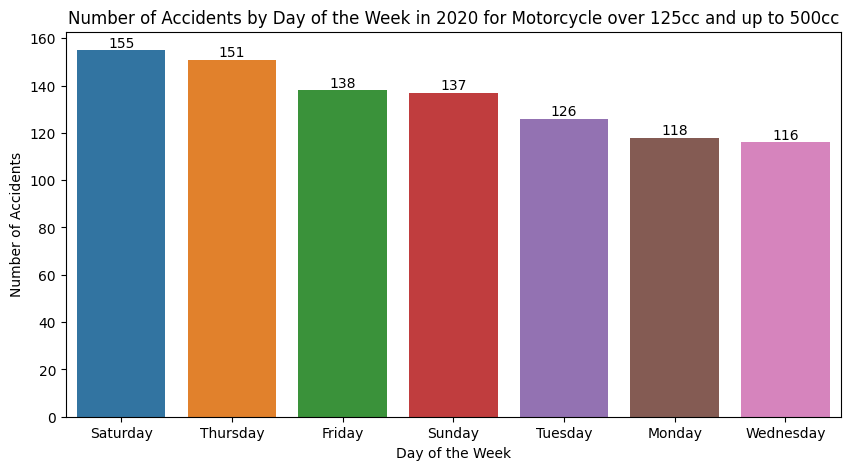

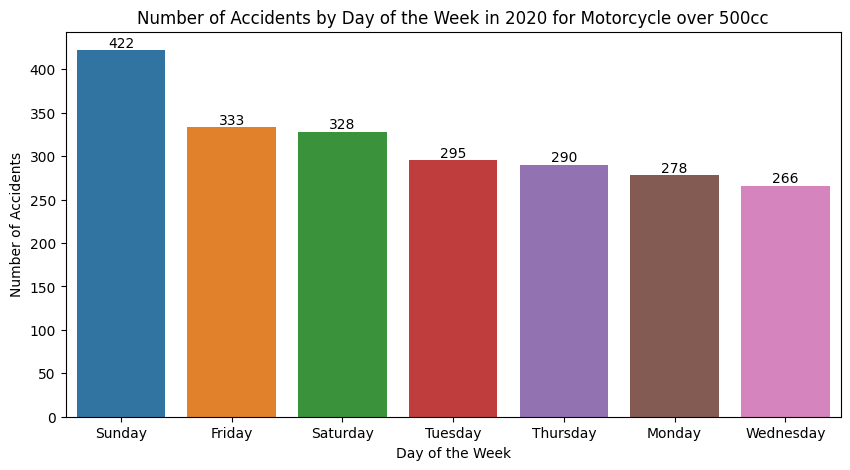

In [81]:
# Mapping the motorbike codes to their respective names
motorbike_types = {
    3: 'Motorcycles 125cc and under',
    4: 'Motorcycle over 125cc and up to 500cc',
    5: 'Motorcycle over 500cc',
}

# Looping through each motorbike code and its corresponding name
for motorbike_code, motorbike_name in motorbike_types.items():
    # Filtering the DataFrame to include only the rows that match the current motorbike code
    motorbike_df = acc_veh_df[acc_veh_df['vehicle_type'] == motorbike_code]

    # Creating a suffix for the title based on the motorbike name
    title_suffix = f'for {motorbike_name}'
    
    # Creating a suffix for the saved file name by converting the motorbike name to lowercase and replacing spaces with underscores
    save_suffix = f'{motorbike_name.replace(" ", "_").lower()}'

    # Calling the function to create a plot for each specific motorbike type
    # The column is set to 'day', and the title and save suffixes are passed to customize the plot title and saved file name
    accidents_plot_day_month(motorbike_df, column='day', title_suffix=title_suffix, save_suffix=save_suffix)


In 2020, **Motorcycles with a capacity of 125cc and under**, witnessed the highest number of accidents with 762 incidents on Fridays, closely followed by Thursdays with 739 accidents. The trend continued with 676 accidents on Wednesdays, 612 on Saturdays, 603 on Tuesdays, 599 on Mondays, and the week rounded off with Sundays having the lowest number at 516. Interestingly, despite being a part of the weekend, Sundays were the safest for these riders, while Fridays and Thursdays proved to be the riskiest.

For **Motorcycles with engine capacities over 125cc and up to 500cc**, the accidents data for the weekdays reveals a distribution with its own distinct pattern. Saturdays top the list with 155 accidents, followed by Thursdays with 151 incidents. Fridays see a slight decrease to 138 accidents, and Sundays come closely behind with 137. The numbers continue to decrease through the rest of the week, with 126 accidents on Tuesdays, 118 on Mondays, and Wednesdays having the lowest occurrence with 116 accidents. Unlike the trend for smaller motorcycles, Wednesdays seem to be the safest for riders in this engine capacity range, while the weekends remain a time of higher risk.

For **Motorcycles with engine capacities over 500cc**, the number of accidents in 2020 was highest on Sundays with 422 incidents, followed by Fridays with 333, and Saturdays with 328. The weekdays saw fewer accidents, with Tuesdays at 295, Thursdays at 290, Mondays at 278, and Wednesdays with the lowest at 266.

#### CHECKING THE MONTHLY NUMBER OF ACCIDENTS FOR THE 3 SPECIFIED MOTORBIKES 

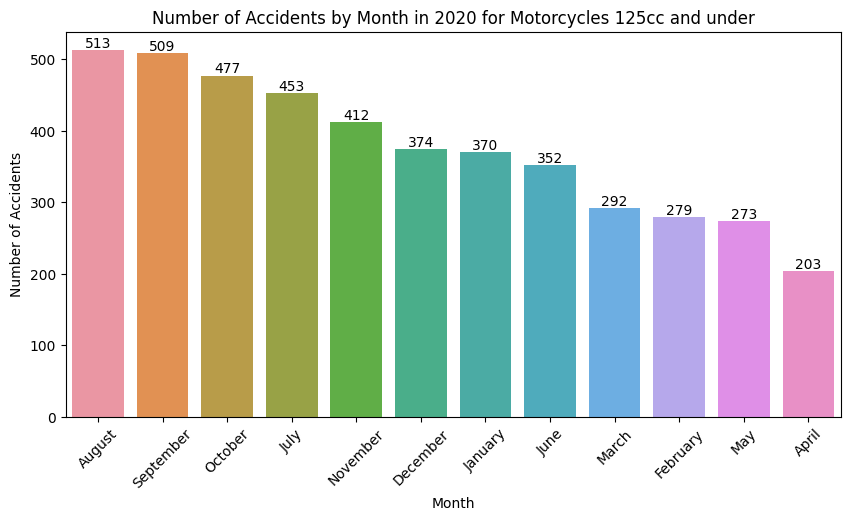

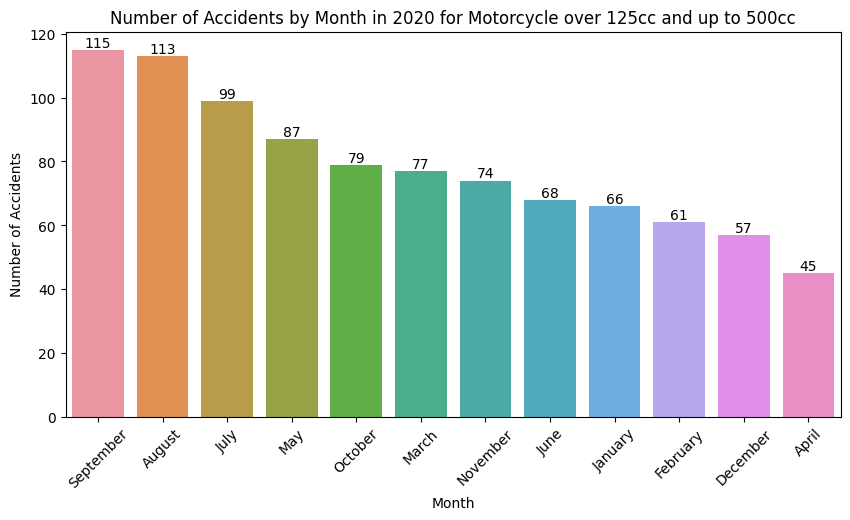

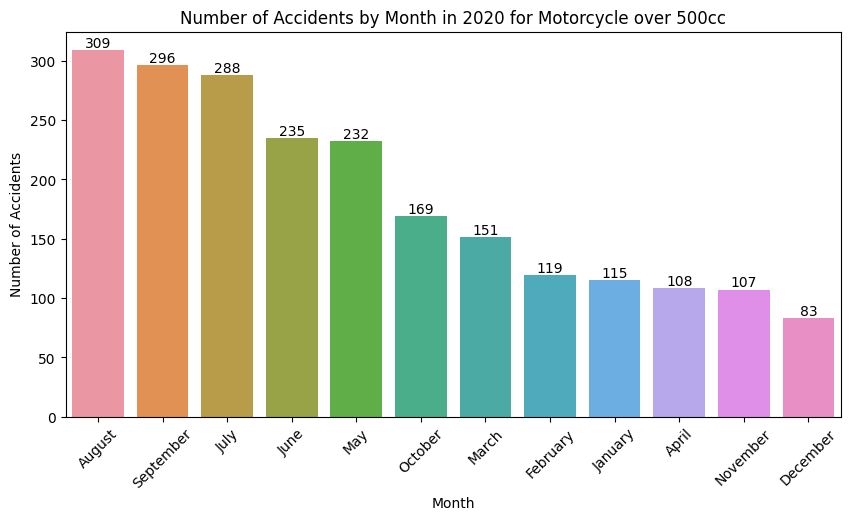

In [82]:
# Mapping the motorbike codes to their respective names
motorbike_types = {
    3: 'Motorcycles 125cc and under',
    4: 'Motorcycle over 125cc and up to 500cc',
    5: 'Motorcycle over 500cc',
}

# Looping through each motorbike code and its corresponding name
for motorbike_code, motorbike_name in motorbike_types.items():
    # Filtering the DataFrame to include only the rows that match the current motorbike code
    motorbike_df = acc_veh_df[acc_veh_df['vehicle_type'] == motorbike_code]

    # Creating a suffix for the title based on the motorbike name
    title_suffix = f'for {motorbike_name}'
    
    # Creating a suffix for the saved file name by converting the motorbike name to lowercase and replacing spaces with underscores
    save_suffix = f'{motorbike_name.replace(" ", "_").lower()}'

    # Calling the function to create a plot for each specific motorbike type
    # The column is set to 'day', and the title and save suffixes are passed to customize the plot title and saved file name
    accidents_plot_day_month(motorbike_df, column='month', title_suffix=title_suffix, save_suffix=save_suffix)


Based on the analysis of the significant month of accident with **Motorcycles 125cc and under** in 2020, August had the highest accidents at 513, followed by September (509) and October (477). The fewest accidents were in April with 203, while July (453) and November (412) also had notable figures.

September recorded the highest number of accidents with 115 incidents for **Motorcycles over 125cc and up to 500cc** in 2020, this was closely followed by August (113) and July (99). The months with the fewest accidents were April (45), December (57), and February (61).

In 2020, **Motorcycles over 500cc** saw the most accidents in August, with 309 incidents. September was close behind with 296, followed by July at 288. Meanwhile, December recorded the fewest at 83, with November and April also on the lower end, reporting 107 and 108 accidents respectively.

### TASK 3 

### For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved?

#### CASUALTY CLASS CODES
1.  Driver or rider

2. Vehicle or pillion passenger

**3. Pedestrian**

In [83]:
casualty_df.sample(4) # Quick glance of the Casualty dataframe

,casualty_index,accident_year,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,accident_index,accident_reference
85003,569751,2020,1,1,1,1,16,4,3,0,0,0,0,0,2,2,9,2020440422683,440422683
56885,541633,2020,2,1,1,1,52,8,3,0,0,0,0,0,1,3,5,2020220990268,220990268
33269,518017,2020,1,1,3,1,12,3,3,5,4,0,0,0,0,1,2,202006P367749,06P367749
54337,539085,2020,2,1,1,2,22,5,3,0,0,0,0,0,9,1,4,2020201033484,201033484


In [84]:
needed_casualty_cols = casualty_df[['casualty_class', 'accident_index', 'pedestrian_movement', 'pedestrian_location', 'pedestrian_road_maintenance_worker']]
needed_casualty_cols.head()

,casualty_class,accident_index,pedestrian_movement,pedestrian_location,pedestrian_road_maintenance_worker
0,3,2020010219808,5,9,0
1,3,2020010220496,1,1,0
2,3,2020010220496,1,1,0
3,3,2020010228005,9,5,0
4,3,2020010228006,1,4,0


In [85]:
needed_casualty_cols.shape # Check the columns and rows  

(115584, 5)

In [86]:
needed_casualty_cols.duplicated().sum() # Checking for duplicates

13758

In [87]:
'''
Dropping duplicates from this dataframe is essential for several reasons. Duplicates can compromise data integrity, 
skew statistical analyses and will negatively impact the performance of my analysis. Removing them ensures each 
entry is unique and enhances the accuracy of the analysis.
'''
# Drop duplicates based on the accident_index column, keeping the first occurrence of each duplicate
needed_casualty_cols = needed_casualty_cols.drop_duplicates(subset=['accident_index'], keep='first')


In [88]:
needed_casualty_cols.shape # The current shape after dropping the duplicates

(91199, 5)

In [89]:
# Merge the needed accident and casualty data
acc_cas_df = pd.merge(accident_df, needed_casualty_cols, on = 'accident_index')
acc_cas_df.head()

,accident_year,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,...,converted_time,decimal_time,hour,day,month,time_of_day,casualty_class,pedestrian_movement,pedestrian_location,pedestrian_road_maintenance_worker
0,2020,521389,175144,-0.254001,51.462262,1,3,1,1,3,...,2023-08-14 09:00:00,9.000000,9,Tuesday,February,Morning,3,5,9,0
1,2020,529337,176237,-0.139253,51.470327,1,3,1,2,2,...,2023-08-14 13:55:00,13.916667,13,Monday,April,Afternoon,3,1,1,0
2,2020,526432,182761,-0.178719,51.529614,1,3,1,1,4,...,2023-08-14 01:25:00,1.416667,1,Wednesday,January,Late Night,3,9,5,0
3,2020,538676,184371,-0.001683,51.541210,1,2,1,1,4,...,2023-08-14 01:50:00,1.833333,1,Wednesday,January,Late Night,3,1,4,0
4,2020,529324,181286,-0.137592,51.515704,1,3,1,2,4,...,2023-08-14 02:25:00,2.416667,2,Wednesday,January,Late Night,3,9,6,0


In [90]:
'''
Selecting rows from the acc_cas_df DataFrame where the casualty_class is equal to 3,which represents pedestrians, 
and storing them in a new DataFrame called pedestrian

''' 
pedestrian = acc_cas_df[acc_cas_df['casualty_class'] == 3] 

In [91]:
pedestrian.head()

,accident_year,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,...,converted_time,decimal_time,hour,day,month,time_of_day,casualty_class,pedestrian_movement,pedestrian_location,pedestrian_road_maintenance_worker
0,2020,521389,175144,-0.254001,51.462262,1,3,1,1,3,...,2023-08-14 09:00:00,9.000000,9,Tuesday,February,Morning,3,5,9,0
1,2020,529337,176237,-0.139253,51.470327,1,3,1,2,2,...,2023-08-14 13:55:00,13.916667,13,Monday,April,Afternoon,3,1,1,0
2,2020,526432,182761,-0.178719,51.529614,1,3,1,1,4,...,2023-08-14 01:25:00,1.416667,1,Wednesday,January,Late Night,3,9,5,0
3,2020,538676,184371,-0.001683,51.541210,1,2,1,1,4,...,2023-08-14 01:50:00,1.833333,1,Wednesday,January,Late Night,3,1,4,0
4,2020,529324,181286,-0.137592,51.515704,1,3,1,2,4,...,2023-08-14 02:25:00,2.416667,2,Wednesday,January,Late Night,3,9,6,0


In [92]:
pedestrian['casualty_class'].unique() # Confirming the unique entries

array([3], dtype=int64)

## Pedestrians significant hours accidents

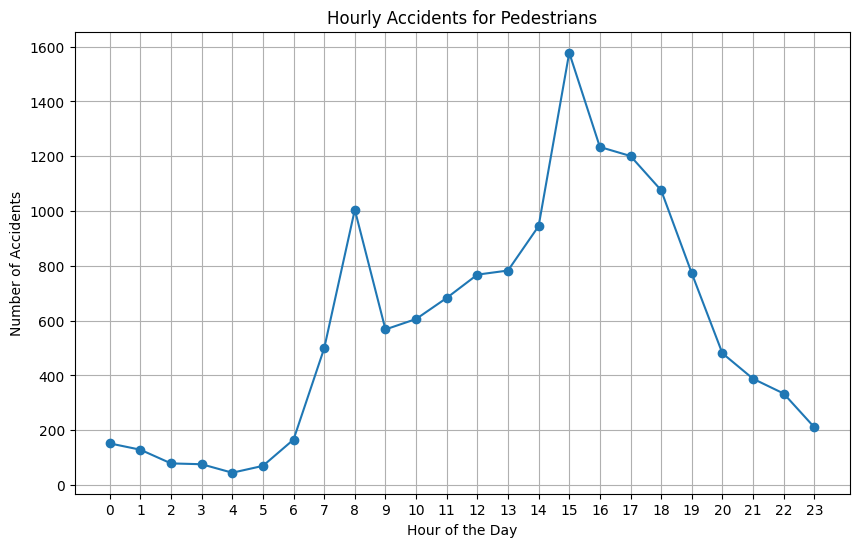

In [93]:
# Get the value counts for each hour
hour_counts = pedestrian['hour'].value_counts().sort_index()

# Create a line plot of the counts
plt.figure(figsize=(10, 6))
plt.plot(hour_counts.index, hour_counts.values, marker='o')

# Add labels and title
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.title('Hourly Accidents for Pedestrians')
plt.grid(True)
plt.xticks(range(24))  #  show all 24 hours on the x-axis

# Save the plot to the working directory
plt.savefig('hourly_accidents_pedestrians.png')

# Display the plot
plt.show()


In [94]:
# Confirming the exact value count per hour
pedestrian['hour'].value_counts().sort_index()

0      152
1      129
2       79
3       76
4       45
5       70
6      166
7      499
8     1005
9      568
10     606
11     683
12     768
13     783
14     945
15    1578
16    1234
17    1201
18    1076
19     773
20     481
21     388
22     334
23     211
Name: hour, dtype: int64

The analysis reveals a pattern in pedestrian accidents:

Midnight to Early Morning (12 AM - 5 AM): The fewest accidents, perhaps due to less road activity

Morning Rush Hour (6-9 AM): Sharp increase in accidents reaching the highest point at 8AM, then a moderate decline at 9AM.
Midday to Early Afternoon (10 AM - 2 PM): Began to rise steadily.

Afternoon Rush Hour (3-6 PM): This time period as shown in the plot has the highest significant hours pedestrians involve in accidents. This peaked at 3PM before its moderate decrease though still high numbers.

Evening (7-11 PM): The number of accidents gradually declined.


In summary, the data suggests that pedestrian accidents are more likely at 8AM, and 3Pm to 6PM which is during the morning and afternoon rush hours. These trends is reflective of a typical daily activity patterns, where more people are on the roads during commuting times and regular business hours.

## Pedestrians significant days of the week accidents

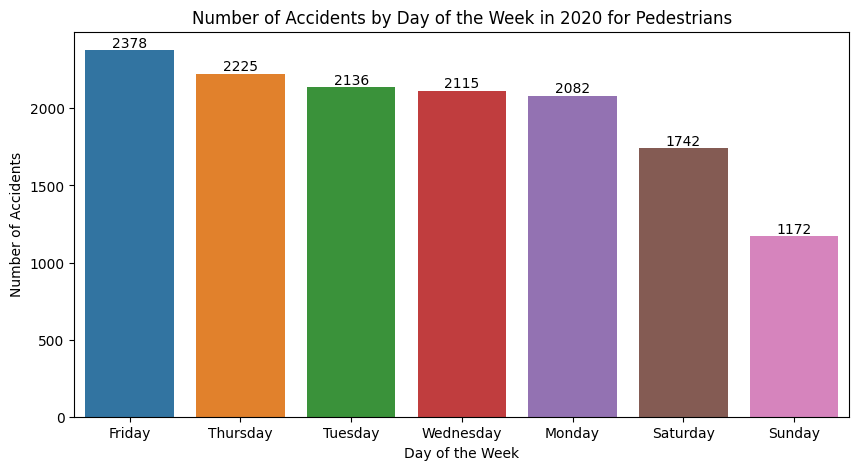

In [95]:
# Calling the function I defined earlier to visualise the days pedestrians are more likely to be involved in an accidents
accidents_plot_day_month(pedestrian, column='day', title_suffix='for Pedestrians', save_suffix='pedestrians')

Upon analysing the significant days of the week on which pedestrians are more likely to be involved in an accident, the resulting plot demonstrates that the number of pedestrian accidents is highest on Fridays and gradually decreases throughout the weekend, with the lowest number occurring on Sundays. The weekdays (Monday to Friday) show higher accident counts, possibly reflecting regular work and school commuting patterns. Conversely, the weekend (Saturday and Sunday) shows a decline, likely corresponding with reduced road activity.


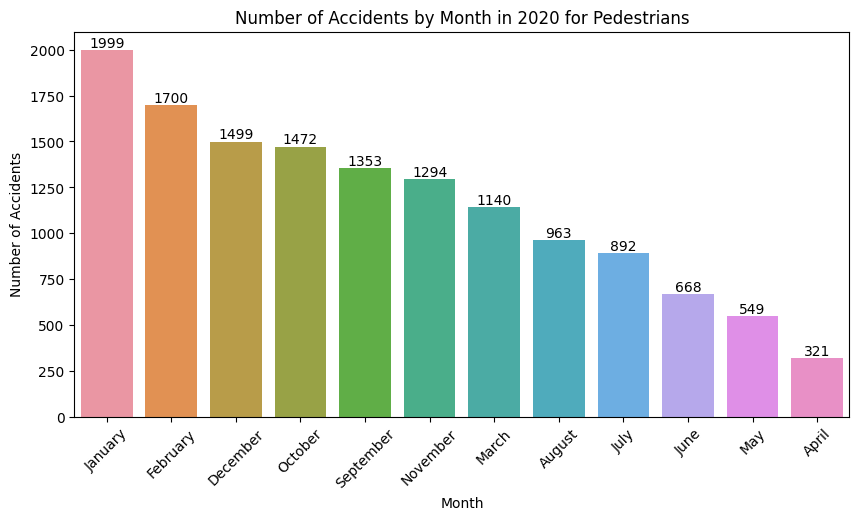

In [96]:
# Calling the function I defined earlier to visualise the months pedestrians are more likely to be involved in an accidents
accidents_plot_day_month(pedestrian, column='month', title_suffix='for Pedestrians', save_suffix='pedestrians')

Upon examining the data, certain patterns emerge:

Winter (December, January, February): Accidents involving pedestrians are more prevalent in these months, likely tied to challenging weather such as snow and ice, as well as diminished visibility.

Spring (March, April, May): This season sees a reduction in pedestrian accidents, reaching the lowest in April, potentially due to more favourable weather and longer daylight hours.

Summer (June, July, August): A modest rise in accidents occurs throughout the summer, though the numbers remain lower than those in winter.

Autumn (September, October, November): The frequency of pedestrian accidents starts to climb again, heading towards winter.

The data outlines a distinct seasonal pattern, with the likelihood of pedestrian accidents being highest in winter, declining in spring, gently rising in summer, and then increasing again as autumn progresses. Factors such as weather conditions and the length of daylight might influence these patterns.




#### CHECKING THE WHEN, WHERE, AND UNDER WHAT CONDITIONS THE PEDESTRIANS ACCIDENTS HAPPENED

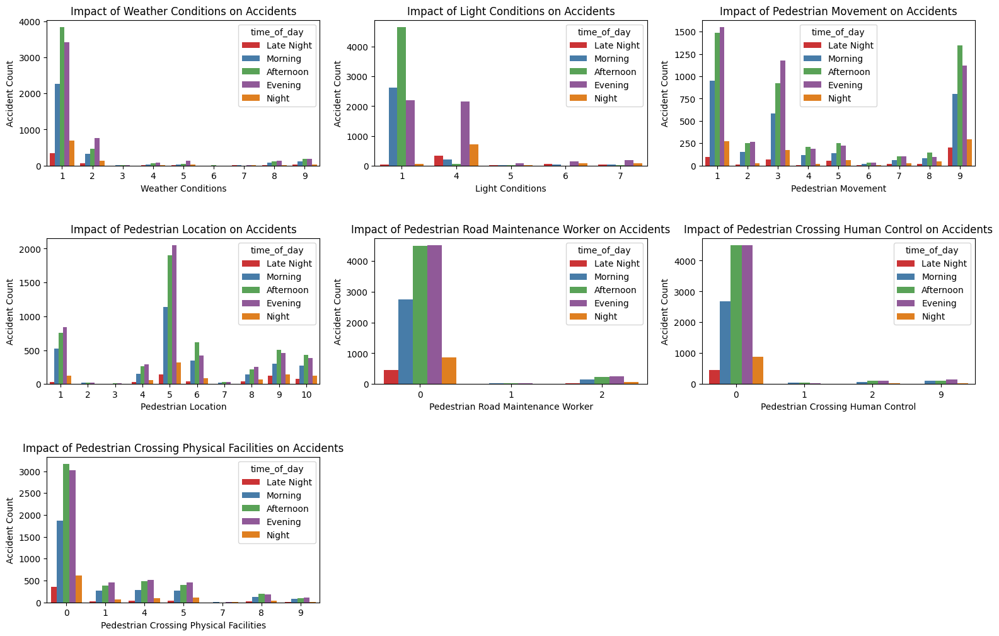

In [97]:
columns = ['weather_conditions', 'light_conditions', 'pedestrian_movement', 'pedestrian_location', 'pedestrian_road_maintenance_worker', 
           'pedestrian_crossing_human_control', 'pedestrian_crossing_physical_facilities']

# Mapping the columns to more descriptive labels
column_labels = {
    'weather_conditions': 'Weather Conditions',
    'light_conditions': 'Light Conditions',
    'pedestrian_movement': 'Pedestrian Movement',
    'pedestrian_location': 'Pedestrian Location',
    'pedestrian_road_maintenance_worker': 'Pedestrian Road Maintenance Worker',
    'pedestrian_crossing_human_control': 'Pedestrian Crossing Human Control',
    'pedestrian_crossing_physical_facilities': 'Pedestrian Crossing Physical Facilities'
}

# Creating a figure and axes for the subplots (3 rows, 3 columns)
fig = plt.figure(figsize=(19, 12))

# Creating a 3x3 grid
gs = gridspec.GridSpec(3, 3)
gs.update(hspace=0.5)  # Adjusts space between subplots

# Iterate through the columns and create a barplot for each
for index, col in enumerate(columns):
    # Determine the row and column in the grid for the current plot
    row = index // 3
    col_idx = index % 3

    # Create an axis object for the current subplot
    ax = plt.subplot(gs[row, col_idx])

    # Group by the variable and time period, then count the number of accidents
    grouped_data = pedestrian.groupby([col, 'time_of_day']).size().reset_index(name='accident_count')

    # Create a barplot on the current subplot
    sns.barplot(x=col, y='accident_count', hue='time_of_day', data=grouped_data, palette='Set1', ax=ax)

    # Set the labels and title for the plot
    ax.set_xlabel(column_labels[col])
    ax.set_ylabel('Accident Count')
    ax.set_title(f'Impact of {column_labels[col]} on Accidents')

plt.show()

# Save the figure to a file and ensure that all the labels and titles fit within the saved image
fig.savefig('pedestrians_accidents_conditions_analysis.png', format='png', bbox_inches='tight')


BELOW CODE MEANINGS FROM STATS20 AND SOME CODES (9) THAT WERE IMPUTED AS UNKNOWN WAS IN ACCORDANCE WITH https://data.dft.gov.uk/road-accidents-safety-data/Road-Safety-Open-Dataset-Data-Guide.xlsx

#### WEATHER CONDITION CODE MEANING

**1**    Fine without high winds

**2**    Raining without high winds

**3**    Snowing without high winds

**4**    Fine with high winds

**5**    Raining with high winds

**6**    Snowing with high winds

**7**    Fog or mist — if hazard

**8**    Other

**9**    Unknown

#### LIGHT CONDITION CODE MEANING
**1**    Daylight:

**4**    Darkness: street lights present and lit

**5**    Darkness: street lights present but unlit

**6**    Darkness: no street lighting

**7**    Darkness: street lighting unknown 

#### PEDESTRIAN MOVEMENT CODES
**1.** Crossing from driver's nearside

**2.** Crossing from driver's nearside - masked by parked or stationary vehicle

**3.** Crossing from driver's offside

**4.** Crossing from driver's offside - masked by parked or stationary vehicle

**5.** In carriageway, stationary - not crossing (standing or playing)

**6.** In carriageway, stationary - not crossing (standing or playing), masked by parked or stationary vehicle

**7.** Walking along in carriageway - facing traffic

**8.** Walking along in carriageway - back to traffic

**9.** Unknown or other

#### PEDESTRIAN LOCATION CODES
**1.** In carriageway, crossing on pedestrian crossing facility

**2.** In carriageway, crossing within zig-zag lines at crossing approach

**3.** In carriageway, crossing within zig-zag lines at crossing exit

**4.** In carriageway, crossing elsewhere within 50 metres of pedestrian crossing

**5.** In carriageway, crossing elsewhere

**6.** On footway or verge

**7.** On refuge, central island or central reservation

**8.** In centre of carriageway, not on refuge, central island or central reservation

**9.** In carriageway, not crossing

**10.** Unknown or other


#### PEDESTRIAN ROAD MAINTENANCE WORKER CODES
**0.** Not applicable

**1.** Yes

**2.** Not known

#### PEDESTRIAN CROSSING - HUMAN CONTROL CODES
**0.** None within 50 metres

**1.** Control by school crossing patrol

**2.** Control by other authorised person

#### PEDESTRIAN CROSSING - PHYSICAL FACILITIES CODES
**0.** No physical crossing facility within 50 metres

**1.** Zebra crossing

**4.** Pelican, puffin, toucan or similar non-junction pedestrian light crossing

**5.** Pedestrian phase at traffic signal junction

**7.** Footbridge or subway

**8.** Central refuge - no other controls

After examining the conditions under which pedestrian accidents occurred, the resulting analysis reveals that most of the incidents took place during clear weather without the presence of high winds (code 1), across all times of the day. Incidents occurring during rain without high winds (code 2) were the next most common.

Darkness (codes 4, 5, and 6) had a moderate influence on the number of pedestrian accidents, showing a strong correlation with incidents during the evening and night. However, the bulk of the recorded accidents happened in daylight (code 1), aligning with the significant hours when pedestrians were involved in accidents, as detailed above. Most accidents occurred when pedestrians were either crossing from the driver's near side (code 1), crossing from the driver's offside (code 3), or when the pedestrian movement was unclear (code 9), with the latter categorized as unknown by RTA (https://data.dft.gov.uk/road-accidents-safety-data/Road-Safety-Open-Dataset-Data-Guide.xlsx). Majority of these pedestrian accidents took place on the carriageway specifically when individuals were crossing elsewhere (code 5).

It is worth highlighting that those involved in these accidents were not pedestrian road maintenance workers (code 1). Most of the pedestrians were crossing areas where human control was absent within a 50-metre radius (code 0), and where there were no designated crossing facilities within the same distance (code 0).

## TASK 4

# Using the apriori algorithm, explore the impact of selected variables on accident severity.  

Apriori algorithm also association rules are rules that exists between two on more items. It tells us how related are two items, what their association is.

**SUPPORT:** Items/variables that occur frequently together. High support value means there is a strong relationship between the antecedent and consequent.
    
**CONFIDENCE:** High confidence value means high predictive value, that the consequent are frequently found when the antecedent is present.

**LIFT:** Lift is a measure of how much more likely the consequent is to appear in a transaction when the antecedent is present. Lift indicates strong association between the antecedent and consequent when the value is **greater than 1**, when the value is **equal to 1** means they are independent of each other, there is no association between the antecedent and consequent, when the value is **less than 1** it means negative association, as the antecedent increases the consequent decreases.

### VARIABLES SELECTION FOR THE APRIORI ACROSS THE THREE TABLES

**Below are the selected possible variables that I suppose will have impact on accident severity. I selected the accident index to be able to join the tables**

**FROM ACCIDENT TABLE:** accident_index, accident_severity speed_limit, road_type, number_of_vehicles, weather_conditions, road_surface_conditions, junction_detail.

**FROM VEHICLE TABLE:** accident_index, vehicle_type,  age_of_vehicle, age_of_driver.

**FROM CASUALTY TABLE:** accident_index, casualty_class, age_of_casualty, casualty_severity, sex_of_casualty, casualty_type, pedestrian_location.

In [98]:
apr_accident_var = ['accident_index', 'accident_severity', 'light_conditions', 'number_of_casualties', 'road_type', 'number_of_vehicles', 'weather_conditions', 'junction_detail']
apr_vehicle_var = ['accident_index', 'vehicle_type', 'age_of_vehicle', 'sex_of_driver']
apr_casualty_var = ['accident_index', 'casualty_class', 'pedestrian_location', 'pedestrian_movement']

In [99]:
# Subsetting the original data frame
accident_var = accident_df[apr_accident_var]
vehicle_var = vehicle_df[apr_vehicle_var]
casualty_var = casualty_df[apr_casualty_var]

In [100]:
accident_var.head()

,accident_index,accident_severity,light_conditions,number_of_casualties,road_type,number_of_vehicles,weather_conditions,junction_detail
0,2020010219808,3,1,1,6,1,9,0
1,2020010220496,3,1,2,6,1,1,9
2,2020010228005,3,4,1,6,1,1,3
3,2020010228006,2,4,1,6,1,1,0
4,2020010228011,3,4,2,6,1,1,3


In [101]:
accident_var.shape # Checking the columns and  rows

(91199, 8)

In [102]:
accident_var.info() #confirming the datatypes I selected

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91199 entries, 0 to 91198
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   accident_index        91199 non-null  object
 1   accident_severity     91199 non-null  int64 
 2   light_conditions      91199 non-null  Int64 
 3   number_of_casualties  91199 non-null  int64 
 4   road_type             91199 non-null  int64 
 5   number_of_vehicles    91199 non-null  int64 
 6   weather_conditions    91199 non-null  Int64 
 7   junction_detail       91199 non-null  Int64 
dtypes: Int64(3), int64(4), object(1)
memory usage: 5.8+ MB


### I WILL SELECT THE VARIABLES THAT I WILL USE FROM THESE DATAFRAME AND EXPLORE THEIR IMPACT ON ACCIDENT SEVERITY

In [103]:
# Merge the accident dataset and vehicle
accident_vehicle = accident_var.merge(vehicle_var, on = 'accident_index')

# Merge the outputed dataset with casualty data
apriori_col_df = accident_vehicle.merge(casualty_var, on = 'accident_index')

apriori_col_df.head()

,accident_index,accident_severity,light_conditions,number_of_casualties,road_type,number_of_vehicles,weather_conditions,junction_detail,vehicle_type,age_of_vehicle,sex_of_driver,casualty_class,pedestrian_location,pedestrian_movement
0,2020010219808,3,1,1,6,1,9,0,9,6,2,3,9,5
1,2020010220496,3,1,2,6,1,1,9,9,2,1,3,1,1
2,2020010220496,3,1,2,6,1,1,9,9,2,1,3,1,1
3,2020010228005,3,4,1,6,1,1,3,9,3,3,3,5,9
4,2020010228006,2,4,1,6,1,1,0,8,8,1,3,4,1


In [104]:
apriori_col_df.shape

(220435, 14)

In [105]:
# First check for duplicates
apriori_col_df.duplicated().sum()

33082

In [106]:
# Dropping the duplicates and assigning it back to the variable for accurate analysis
col_impact_on_sev = apriori_col_df.drop_duplicates(subset=['accident_index'], keep='first')


In [107]:
col_impact_on_sev.head()

,accident_index,accident_severity,light_conditions,number_of_casualties,road_type,number_of_vehicles,weather_conditions,junction_detail,vehicle_type,age_of_vehicle,sex_of_driver,casualty_class,pedestrian_location,pedestrian_movement
0,2020010219808,3,1,1,6,1,9,0,9,6,2,3,9,5
1,2020010220496,3,1,2,6,1,1,9,9,2,1,3,1,1
3,2020010228005,3,4,1,6,1,1,3,9,3,3,3,5,9
4,2020010228006,2,4,1,6,1,1,0,8,8,1,3,4,1
5,2020010228011,3,4,2,6,1,1,3,9,4,1,3,6,9


In [108]:
col_impact_on_sev.shape

(91199, 14)

In [109]:
# Dropping some specific columns
col_impact_on_sev = col_impact_on_sev.drop(['accident_index'], axis = 1)

col_impact_on_sev.sample(4)

,accident_severity,light_conditions,number_of_casualties,road_type,number_of_vehicles,weather_conditions,junction_detail,vehicle_type,age_of_vehicle,sex_of_driver,casualty_class,pedestrian_location,pedestrian_movement
149896,3,1,1,1,1,7,1,9,16,1,1,0,0
4756,3,1,1,6,2,1,3,9,4,2,1,0,0
13751,3,4,1,6,2,1,7,9,15,1,2,0,0
144732,3,1,1,6,2,1,3,1,13,1,1,0,0


In [110]:
# Function to encode individual values
def variables_encoded(a):
    if a <= 1: # If the value is less than or equal to 1, return 0
        return 0
    else: # Otherwise, return 1
        return 1

# Applying the encoding function to each column in the dataframe using the 'applymap' method

col_impact_on_sev_encod = col_impact_on_sev.applymap(variables_encoded)


In [111]:
col_impact_on_sev_encod.head() # The encoded dataframe

,accident_severity,light_conditions,number_of_casualties,road_type,number_of_vehicles,weather_conditions,junction_detail,vehicle_type,age_of_vehicle,sex_of_driver,casualty_class,pedestrian_location,pedestrian_movement
0,1,0,0,1,0,1,0,1,1,1,1,1,1
1,1,0,1,1,0,0,1,1,1,0,1,0,0
3,1,1,0,1,0,0,1,1,1,1,1,1,1
4,1,1,0,1,0,0,0,1,1,0,1,1,0
5,1,1,1,1,0,0,1,1,1,0,1,1,1


In [112]:
# Supported frequent itemsets 20% minimum support and assigning them to a variable
frequent_variables = apriori(col_impact_on_sev_encod, min_support=0.2, use_colnames=True)
frequent_variables

C:\Users\759635\AppData\Roaming\Python\Python310\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,support,itemsets
0,0.984748,(accident_severity)
1,0.293205,(light_conditions)
2,0.938815,(road_type)
3,0.717870,(number_of_vehicles)
4,0.224454,(weather_conditions)
...,...,...
125,0.270825,"(road_type, accident_severity, sex_of_driver, ..."
126,0.318457,"(number_of_vehicles, accident_severity, juncti..."
127,0.204454,"(number_of_vehicles, accident_severity, sex_of..."
128,0.315815,"(road_type, number_of_vehicles, junction_detai..."


In [113]:
# Getting the length of the itemsets

frequent_variables['length'] = frequent_variables['itemsets'].apply(lambda x: len(x))
frequent_variables

,support,itemsets,length
0,0.984748,(accident_severity),1
1,0.293205,(light_conditions),1
2,0.938815,(road_type),1
3,0.717870,(number_of_vehicles),1
4,0.224454,(weather_conditions),1
...,...,...,...
125,0.270825,"(road_type, accident_severity, sex_of_driver, ...",5
126,0.318457,"(number_of_vehicles, accident_severity, juncti...",5
127,0.204454,"(number_of_vehicles, accident_severity, sex_of...",5
128,0.315815,"(road_type, number_of_vehicles, junction_detai...",5


In [114]:
#filters to include only rows where the 'length' column is greater than 1 and the 'support' column is at least 0.2
frequent_variables[(frequent_variables['length'] > 1) & (frequent_variables['support'] >= 0.2)]

,support,itemsets,length
10,0.286779,"(light_conditions, accident_severity)",2
11,0.923892,"(road_type, accident_severity)",2
12,0.709876,"(number_of_vehicles, accident_severity)",2
13,0.221559,"(weather_conditions, accident_severity)",2
14,0.498416,"(junction_detail, accident_severity)",2
...,...,...,...
125,0.270825,"(road_type, accident_severity, sex_of_driver, ...",5
126,0.318457,"(number_of_vehicles, accident_severity, juncti...",5
127,0.204454,"(number_of_vehicles, accident_severity, sex_of...",5
128,0.315815,"(road_type, number_of_vehicles, junction_detai...",5


In [115]:
pd.set_option('display.max_rows', 200)

In [116]:
filtered_df = frequent_variables[frequent_variables['itemsets'].apply(lambda x: 'accident_severity' in x)]
filtered_df

,support,itemsets,length
0,0.984748,(accident_severity),1
10,0.286779,"(light_conditions, accident_severity)",2
11,0.923892,"(road_type, accident_severity)",2
12,0.709876,"(number_of_vehicles, accident_severity)",2
13,0.221559,"(weather_conditions, accident_severity)",2
14,0.498416,"(junction_detail, accident_severity)",2
15,0.920964,"(accident_severity, vehicle_type)",2
16,0.878738,"(age_of_vehicle, accident_severity)",2
17,0.331725,"(sex_of_driver, accident_severity)",2
18,0.230386,"(accident_severity, casualty_class)",2


As higher support values mean that the corresponding variable is more frequently associated with accident severity. The itemsets with the support values of 0.923892 for (road_type, accident_severity), 0.920964 for (accident_severity, vehicle_type)shows a strong association between road_type and accident_severity, and between accident_severity and vehicle_type as they appear together in about 92.39% and 92.1%, respectively in the transactions.

### Generating some rules from frequent items

In [117]:
# Generating association rules with a specific minimum confidence
rules = association_rules(frequent_variables, metric='confidence', min_threshold=0.9)

# Filtering rules to concentrate on those that include 'accident_severity' in the consequents and have a lift greater than 1
rules_with_accident_severity = rules[(rules['consequents'].apply(lambda x: 'accident_severity' in x)) & (rules['lift'] > 1)]

rules_with_accident_severity


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
3,(number_of_vehicles),(accident_severity),0.717870,0.984748,0.709876,0.988865,1.004181,0.002956,1.369762,0.014758
4,(weather_conditions),(accident_severity),0.224454,0.984748,0.221559,0.987103,1.002392,0.000529,1.182636,0.003077
5,(junction_detail),(accident_severity),0.503240,0.984748,0.498416,0.990413,1.005753,0.002851,1.590925,0.011515
9,(sex_of_driver),(accident_severity),0.334499,0.984748,0.331725,0.991707,1.007067,0.002328,1.839085,0.010544
34,(light_conditions),"(accident_severity, vehicle_type)",0.293205,0.920964,0.274477,0.936126,1.016463,0.004445,1.237366,0.022915
36,"(road_type, number_of_vehicles)",(accident_severity),0.666400,0.984748,0.658472,0.988104,1.003408,0.002236,1.282105,0.010181
39,"(weather_conditions, road_type)",(accident_severity),0.211165,0.984748,0.208336,0.986603,1.001884,0.000392,1.138488,0.002384
41,(weather_conditions),"(road_type, accident_severity)",0.224454,0.923892,0.208336,0.928188,1.004650,0.000964,1.059821,0.005968
42,"(junction_detail, road_type)",(accident_severity),0.495609,0.984748,0.490795,0.990287,1.005626,0.002746,1.570368,0.011091
44,(junction_detail),"(road_type, accident_severity)",0.503240,0.923892,0.490795,0.975270,1.055610,0.025855,3.077524,0.106049


On exploring the impact of some selected variables on accident severity, the apriori algorithm reveals intricate relationships between this selected variables and accident severity. The **number of vehicles** shows a 98.89% confidence association with accident severity, with a lift slightly above 1, implying a more than random correlation that the consequent(accident severity) is to likely happen when a particular antecedent(number of vehicles) is present. **Weather conditions**, with a 98.71% confidence and a similar lift, highlight how climatic factors might influence accident outcomes. The **details of a junction** contribute to accident severity with 99.04% confidence, shedding light on the role of infrastructure in road safety. Interestingly, the **sex of driver** with a high predictive confidence level indicates accident severity is found 99.17% of the time a particlar gender is the driver. **Light conditions** link not only to accident severity but also to vehicle type, with a 93.61% confidence and a lift value above 1, alluding to an interconnected likelihood of causality. Finally, the combination of **road type and the number of vehicles forms** a connection with accident severity, supported by a 98.81% confidence and a corresponding lift, reflecting the complex interplay of environmental and human factors in road accidents. 

In summary, these statistical findings convey a story about the multifaceted nature of road safety, where different variables interlock and interweave in subtle ways, affecting the occurence of accidents severity.

##### FURTHER ANALYSIS ON THE IMPACT OF A TYPE OF VARIABLE ABOVE ON DIFFERENT TYPES OF ACCIDENT SEVERITY

In [118]:
# Performing One-hot encoding for accident_severity
accident_severity = pd.get_dummies(col_impact_on_sev.accident_severity, prefix='severity')
accident_severity.head()

,severity_1,severity_2,severity_3
0,0,0,1
1,0,0,1
3,0,0,1
4,0,1,0
5,0,0,1


In [119]:
# Performing One-hot encoding weather conditions
weather = pd.get_dummies(col_impact_on_sev.weather_conditions, prefix='weather')
weather.head()

,weather_1,weather_2,weather_3,weather_4,weather_5,weather_6,weather_7,weather_8,weather_9
0,0,0,0,0,0,0,0,0,1
1,1,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0


In [120]:
# Performing One-hot encoding number_of_vehicles
n_vehicles = pd.get_dummies(col_impact_on_sev.number_of_vehicles, prefix='n_vehicles')
n_vehicles.head()

,n_vehicles_1,n_vehicles_2,n_vehicles_3,n_vehicles_4,n_vehicles_5,n_vehicles_6,n_vehicles_7,n_vehicles_8,n_vehicles_9,n_vehicles_10,n_vehicles_11,n_vehicles_12,n_vehicles_13
0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,0,0,0


In [121]:
# Performing One-hot encoding junction_details
junction_det = pd.get_dummies(col_impact_on_sev.junction_detail, prefix='junction_det')
junction_det.head()

,junction_det_0,junction_det_1,junction_det_2,junction_det_3,junction_det_5,junction_det_6,junction_det_7,junction_det_8,junction_det_9,junction_det_99
0,1,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,1,0
3,0,0,0,1,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0
5,0,0,0,1,0,0,0,0,0,0


In [122]:
# Performing One-hot encoding sex_of_driver
sex_of_driver = pd.get_dummies(col_impact_on_sev.sex_of_driver, prefix='sex_of_driver')
sex_of_driver.head()

,sex_of_driver_1,sex_of_driver_2,sex_of_driver_3
0,0,1,0
1,1,0,0
3,0,0,1
4,1,0,0
5,1,0,0


In [123]:
# Performing One-hot encoding light_conditions
light = pd.get_dummies(col_impact_on_sev.light_conditions, prefix='light')
light.head()

,light_1,light_4,light_5,light_6,light_7
0,1,0,0,0,0
1,1,0,0,0,0
3,0,1,0,0,0
4,0,1,0,0,0
5,0,1,0,0,0


In [124]:
# Performing One-hot encoding road_type
road_type = pd.get_dummies(col_impact_on_sev.road_type, prefix='road_type')
road_type.head()

,road_type_1,road_type_2,road_type_3,road_type_6,road_type_7,road_type_9
0,0,0,0,1,0,0
1,0,0,0,1,0,0
3,0,0,0,1,0,0
4,0,0,0,1,0,0
5,0,0,0,1,0,0


In [125]:
# Concantenating the three one-hot encoded variables together

acc_df_one_enc = pd.concat([accident_severity, weather, light, n_vehicles, road_type, sex_of_driver, junction_det], axis= 1)
acc_df_one_enc.head()

,severity_1,severity_2,severity_3,weather_1,weather_2,weather_3,weather_4,weather_5,weather_6,weather_7,...,junction_det_0,junction_det_1,junction_det_2,junction_det_3,junction_det_5,junction_det_6,junction_det_7,junction_det_8,junction_det_9,junction_det_99
0,0,0,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,0,0,1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,1,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,1,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
5,0,0,1,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [126]:
# Supported frequent itemsets 20% minimum support and assigning them to a variable
frequent_variables = apriori(acc_df_one_enc, min_support=0.2, use_colnames=True)
frequent_variables

C:\Users\759635\AppData\Roaming\Python\Python310\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,support,itemsets
0,0.201263,(severity_2)
1,0.783484,(severity_3)
2,0.775546,(weather_1)
3,0.706795,(light_1)
4,0.208621,(light_4)
5,0.282130,(n_vehicles_1)
6,0.629305,(n_vehicles_2)
7,0.733879,(road_type_6)
8,0.665501,(sex_of_driver_1)
9,0.251812,(sex_of_driver_2)


In [127]:
# Generating association rules with a specific minimum lift
rules = association_rules(frequent_variables, metric="lift", min_threshold=1)
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(light_1),(severity_3),0.706795,0.783484,0.559337,0.791371,1.010066,0.005574,1.037803,0.033990
1,(severity_3),(light_1),0.783484,0.706795,0.559337,0.713910,1.010066,0.005574,1.024869,0.046029
2,(severity_3),(n_vehicles_2),0.783484,0.629305,0.516749,0.659552,1.048065,0.023698,1.088846,0.211811
3,(n_vehicles_2),(severity_3),0.629305,0.783484,0.516749,0.821142,1.048065,0.023698,1.210546,0.123714
4,(severity_3),(sex_of_driver_2),0.783484,0.251812,0.205671,0.262508,1.042477,0.008380,1.014504,0.188191
...,...,...,...,...,...,...,...,...,...,...
345,"(light_1, road_type_6)","(sex_of_driver_1, weather_1, severity_3)",0.525214,0.394116,0.214761,0.408902,1.037517,0.007766,1.025014,0.076161
346,"(weather_1, road_type_6)","(sex_of_driver_1, severity_3, light_1)",0.577353,0.357449,0.214761,0.371976,1.040639,0.008387,1.023130,0.092399
347,(light_1),"(sex_of_driver_1, weather_1, severity_3, road_...",0.706795,0.286461,0.214761,0.303852,1.060708,0.012292,1.024981,0.195200
348,(weather_1),"(sex_of_driver_1, severity_3, light_1, road_ty...",0.775546,0.258797,0.214761,0.276916,1.070014,0.014052,1.025059,0.291520


In [128]:
# Filter rules by lift and where the consequent contains any of the severity values
filtered_rules = rules[
    (rules['lift'] > 1.02) & 
    (rules['consequents'].apply(lambda x: any(severity in x for severity in ['severity_1', 'severity_2', 'severity_3'])))
]

# Print the top rules sorted by confidence
filtered_rules.sort_values(by='confidence', ascending=False)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
51,"(light_1, n_vehicles_2)",(severity_3),0.462450,0.783484,0.380136,0.822004,1.049164,0.017813,1.216404,0.087173
3,(n_vehicles_2),(severity_3),0.629305,0.783484,0.516749,0.821142,1.048065,0.023698,1.210546,0.123714
5,(sex_of_driver_2),(severity_3),0.251812,0.783484,0.205671,0.816765,1.042477,0.008380,1.181625,0.054460
137,"(light_1, weather_1, n_vehicles_2)",(severity_3),0.383031,0.783484,0.311736,0.813867,1.038779,0.011637,1.163230,0.060507
41,"(weather_1, n_vehicles_2)",(severity_3),0.496650,0.783484,0.403996,0.813441,1.038235,0.014878,1.160574,0.073164
205,"(light_1, sex_of_driver_1, n_vehicles_2)",(severity_3),0.304510,0.783484,0.246351,0.809009,1.032579,0.007773,1.133645,0.045365
65,"(sex_of_driver_1, n_vehicles_2)",(severity_3),0.419149,0.783484,0.338458,0.807487,1.030636,0.010061,1.124680,0.051175
192,"(light_1, road_type_6, n_vehicles_2)",(severity_3),0.336583,0.783484,0.271746,0.807369,1.030485,0.008039,1.123991,0.044592
60,"(road_type_6, n_vehicles_2)",(severity_3),0.450805,0.783484,0.363282,0.805852,1.028549,0.010083,1.115210,0.050541
307,"(sex_of_driver_1, weather_1, light_1, n_vehicl...",(severity_3),0.253917,0.783484,0.203511,0.801486,1.022976,0.004571,1.090679,0.030103


## TASK 5

###  Identify accidents in our region: Kingston upon Hull, Humberside, and the East Riding of Yorkshire etc. You can do this by filtering on LSOA, or police region or another method if you can find one. Run clustering on this data. What do these clusters reveal about the distribution of accidents in our region? 

#### FILTERINGTHE DATAFRAME

In [129]:
# Merging accident, vehicle, casualty, and LSOA datasets 
all_df = (
    accident_df
    .merge(vehicle_df, on='accident_index')
    .merge(casualty_df, on='accident_index')
    .merge(lsoa_df, left_on='lsoa_of_accident_location', right_on='lsoa01cd')
)

all_df.head()

,accident_year_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,...,casualty_home_area_type,casualty_imd_decile,accident_reference,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,2020,521389,175144,-0.254001,51.462262,1,3,1,1,3,...,1,4,010219808,4576,E01004576,Wandsworth 013D,Wandsworth 013D,445625.061623,4486.70113,c7ddebfb-d730-4be6-b67e-938adb21309e
1,2020,521357,174350,-0.254734,51.455133,1,2,2,1,6,...,1,8,010240428,4576,E01004576,Wandsworth 013D,Wandsworth 013D,445625.061623,4486.70113,c7ddebfb-d730-4be6-b67e-938adb21309e
2,2020,521357,174350,-0.254734,51.455133,1,2,2,1,6,...,1,8,010240428,4576,E01004576,Wandsworth 013D,Wandsworth 013D,445625.061623,4486.70113,c7ddebfb-d730-4be6-b67e-938adb21309e
3,2020,521564,174913,-0.251563,51.460148,1,3,2,1,7,...,1,4,010249713,4576,E01004576,Wandsworth 013D,Wandsworth 013D,445625.061623,4486.70113,c7ddebfb-d730-4be6-b67e-938adb21309e
4,2020,521564,174913,-0.251563,51.460148,1,3,2,1,7,...,1,4,010249713,4576,E01004576,Wandsworth 013D,Wandsworth 013D,445625.061623,4486.70113,c7ddebfb-d730-4be6-b67e-938adb21309e


In [130]:
all_df.duplicated().sum()

0

In [131]:
'''
Filtering the merged dataframe to include only rows where "police_force" equals 16. 
Stats20 indicate Humbersideregion is marked by the code 16 
''' 
humber_acc_data = all_df[all_df['police_force'] == 16]


In [132]:
# Function to map specific Area names
def area_mapping(area):
    areas = ["Kingston upon Hull", "East Riding of Yorkshire", "North Lincolnshire", "North East Lincolnshire"]
    for x in areas:
        if area.startswith(x):
            return x
    return None

# Apply the function to the 'lsoa01nm' column and create a new column
humber_acc_data['Area'] = humber_acc_data['lsoa01nm'].apply(area_mapping)

# Select the desired columns from the 'humber_acc_data' dataframe
desired_columns = ['police_force', 'longitude', 'latitude', 'lsoa01nm', 'Area', 'weather_conditions', 'speed_limit', 'hour']
location_clust_df = humber_acc_data[desired_columns]


In [133]:
# Accident count of each area 
print(f'The count of each area is:\n{location_clust_df["Area"].value_counts()}')
print(f'The total accidents in Humberside is {sum(location_clust_df["Area"].value_counts())}')

The count of each area is:
Kingston upon Hull          1279
East Riding of Yorkshire    1188
North Lincolnshire           811
North East Lincolnshire      707
Name: Area, dtype: int64
The total accidents in Humberside is 3985


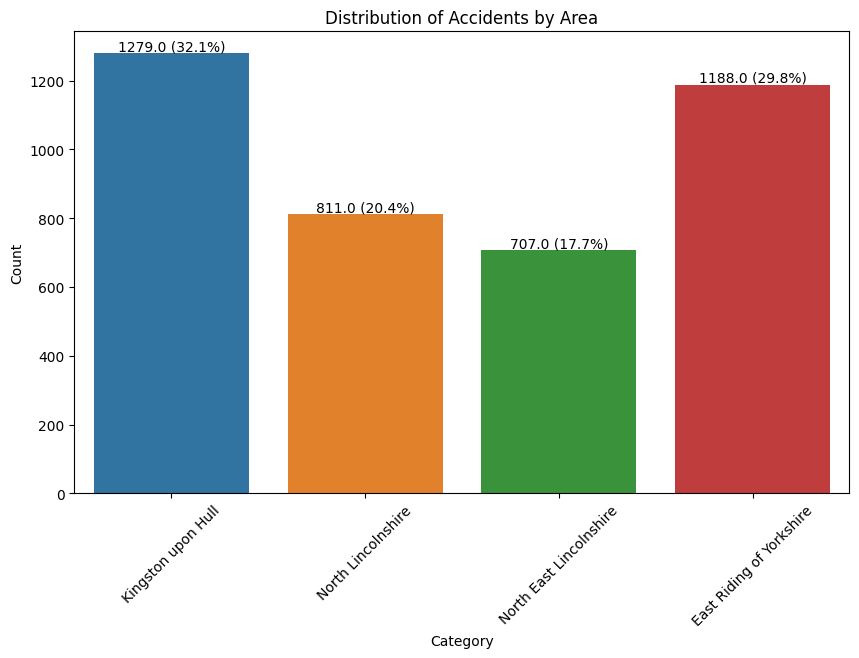

In [134]:
def plot_acc_loc(df, column, title="Distribution", xlabel="Category", ylabel="Count"):
    plt.figure(figsize=(10, 6))
    ax = sns.countplot(x=column, data=df)
    plt.xticks(rotation=45)

    total = len(df)
    # Iterate over the bars (patches)
    for p in ax.patches:
        count = p.get_height()
        # Calculate the percentage of the total
        percentage = '{:.1f}%'.format(100 * count / total)
        x = p.get_x() + p.get_width() / 2
        y = count
        # Add the count and percentage as a label to the bar
        ax.annotate(f'{count} ({percentage})', (x, y), ha='center', va='bottom')

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.savefig('humberside_accidents.png')
    plt.show()

# Calling the function
plot_acc_loc(location_clust_df, 'Area', title="Distribution of Accidents by Area")


In [135]:
# Select the features 'longitude' and 'latitude'
geo_acc = location_clust_df[["longitude", "latitude"]]
geo_acc.sample(10)

,longitude,latitude
83862,-0.703181,53.569801
87121,-0.666108,53.865474
83914,-0.825128,53.930143
86965,-0.258366,53.897437
86395,-0.612856,53.793995
85252,-0.097904,53.571896
84714,-0.307572,53.787351
83844,-0.688039,53.589681
84116,-0.051238,53.555422
87207,-0.113517,53.555701


In [136]:
def find_optimal_clusters(df, min_clusters=2, max_clusters=15, random_seed=0):
    # Initialize lists to store silhouette scores and cluster labels for different numbers of clusters
    silhouette_scores = []
    
    # Loop over different numbers of clusters to perform clustering
    for cluster_num in range(min_clusters, max_clusters+1):
        # Initialize KMeans with the current number of clusters
        kmeans = KMeans(n_clusters=cluster_num, random_state=random_seed)
        
        # Fit the model and predict cluster labels for the dataset
        predicted_clusters  = kmeans.fit_predict(df)
        
        # Calculate the silhouette score for the current clustering
        silhouette_avg = silhouette_score(df, predicted_clusters)
        
        # Append silhouette score to the list
        silhouette_scores.append(silhouette_avg)

    # Plot the Silhouette Score scores for different numbers of clusters
    plt.figure(figsize=(10, 6))
    plt.plot(range(min_clusters, max_clusters+1), silhouette_scores, marker='o')
    plt.xlabel('Number of Clusters', fontsize=12)
    plt.ylabel('Silhouette Score', fontsize=12)
    plt.title('Silhouette Score for Different Numbers of Clusters', fontsize=14)
    plt.xticks(range(min_clusters, max_clusters+1))
    plt.grid(True)
    plt.savefig('silhouette_score.png')
    plt.show()


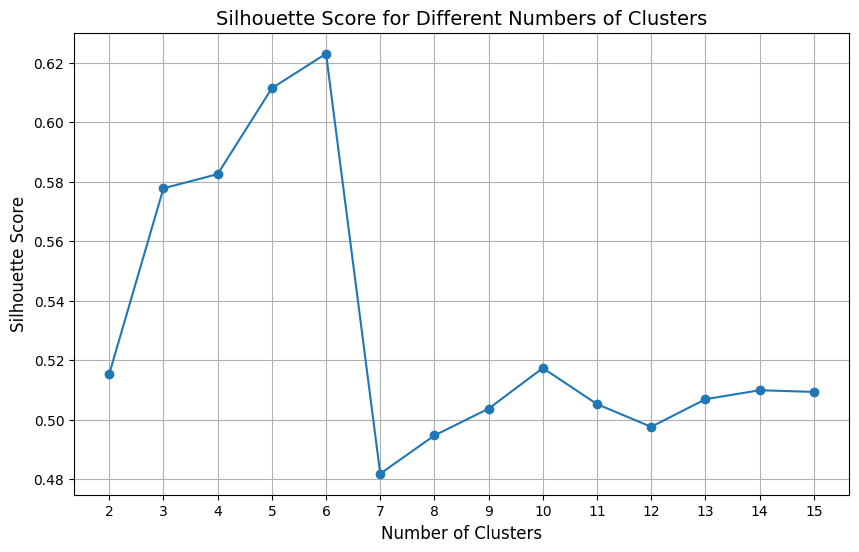

In [137]:
# Calling the function
find_optimal_clusters(geo_acc)

In [138]:
# Best Silhouette score is 6

In [139]:
# Create an instance of the KMeans class with the desired number of clusters (in this case, 6)
kmeans_model = KMeans(n_clusters=6, random_state=42)

# Fit the KMeans model to the cluster accident data
kmeans_model.fit(geo_acc)


KMeans(n_clusters=6, random_state=42)

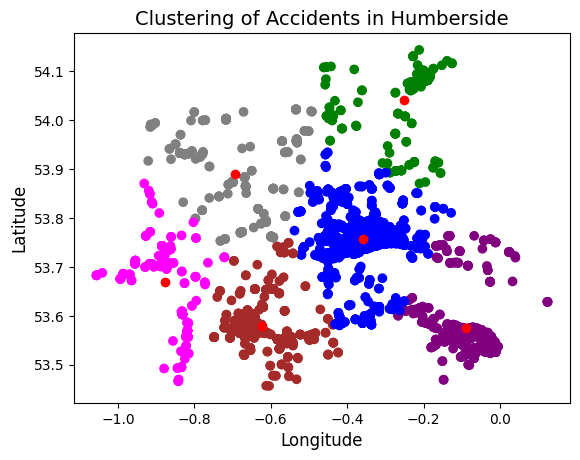

In [140]:
def plot_clusters(geo_acc, n_clusters=6):
    # Create and fit a K-means model
    kmeans_model = KMeans(n_clusters=n_clusters).fit(geo_acc)

    # Predict cluster labels for each data point
    cluster_labels = kmeans_model.predict(geo_acc)

    # Add the cluster labels as a new column in the geo_acc DataFrame
    geo_acc['labels'] = cluster_labels

    # Define colors for the clusters
    map_color = {0: 'blue', 1: 'magenta', 2: 'purple', 3: 'brown', 4: 'green', 5: 'grey'}

    # Map the cluster labels to colors
    colors = [map_color[label] for label in cluster_labels]

    # Plot the clustered points
    plt.scatter(geo_acc['longitude'], geo_acc['latitude'], c=colors)

    # Plot the cluster centroids in orange
    plt.scatter(kmeans_model.cluster_centers_[:, 0], kmeans_model.cluster_centers_[:, 1], color='red')

    # Labels and title
    plt.ylabel('Latitude', fontsize=12)
    plt.xlabel('Longitude', fontsize=12)
    plt.title('Clustering of Accidents in Humberside', fontsize=14)
    
    plt.savefig('accidents_clustering_humberside.png')
    plt.show()

    # Return the updated DataFrame with the cluster labels
    return geo_acc

# Call the function with the `geo_acc` DataFrame and assign the result to geo_acc_with_labels
geo_acc_with_labels = plot_clusters(geo_acc)

# Extracting the accident clusters based on assigned labels that i will use later in the code
location_clusters = {}
for i in range(6):  # For the 6 clusters, labeled from 0 to 5
    location_clusters[f"cluster{i}"] = geo_acc_with_labels.loc[geo_acc_with_labels['labels'] == i, ['latitude', 'longitude']].values.tolist()


In [141]:
#  The map properties
accident_map = folium.Map(location=[53.767965, -0.368914], zoom_start=10, tiles='openstreetmap')

cluster_colors = ['cyan', 'magenta', 'purple', 'brown', 'green', 'grey']

# locate accident cluster points/locations on the map
for idx, cluster in enumerate(location_clusters.values()):
    color = cluster_colors[idx]
    for location in cluster:
        folium.CircleMarker(location, radius=2, color=color, fill_color=color).add_to(accident_map)

# Adding a custom footer to show my name
custom_footer = folium.Html('<div style="font-size: 12px; color: grey;">Map created by Happiness Nwaigwe</div>', script=True)
map_popup = folium.Popup(custom_footer, max_width=250)
folium.Marker(
    location=[53.767965, -0.368914], # My exacct coordinates
    popup=map_popup,
    icon=folium.Icon(icon="info-sign", color="lightgray")
).add_to(accident_map)

# Save the map to an HTML file
accident_map.save('accident_clusters_map.html')

accident_map


From the detailed plots in (Figure 22-Figure 27), CLuster 1 which is found to be the most spatially widespread cluster reveals that Kingston upon Hull has the highest occurrence with 1279 accidents, followed by East Riding of Yorkshire with 1188 accidents. North Lincolnshire and North East Lincolnshire report fewer accidents, with 811 and 707 respectively.

In [142]:

# Extract the clusters based on assigned labels
pointers = [
    geo_acc[["latitude", "longitude"]][geo_acc["labels"] == label].values.tolist()
    for label in range(6)  # Based on 6 clusters 
]

# Calculate the total number of accidents in each cluster
num_cluster = [len(cluster) for cluster in pointers]

# Define map features
accident_map = folium.Map(location=[53.767965, -0.368914], zoom_start=10, tiles='openstreetmap')

# Create a MarkerCluster layer to group markers by proximity
map_marker= MarkerCluster().add_to(accident_map)

# Define colors for clusters, change as needed
cluster_colors = ['cyan','magenta', 'purple', 'brown', 'green', 'grey']

# Loop through clusters and add markers to the MarkerCluster layer
for label, cluster in enumerate(pointers):
    color = cluster_colors[label]  # Select the color for the current cluster
    for location in cluster:
        folium.CircleMarker(
            location=location,
            radius=7,  
            color=color,  # Set the color
            fill_color=color,  # Set the fill color
            fill_opacity=0.9, 
            popup=f"Total Accidents: {num_cluster[label]}"  # Display the total number of accidents in the cluster
        ).add_to(map_marker)

        
# Adding a custom footer to show my name
custom_footer = folium.Html('<div style="font-size: 12px; color: grey;">Map created by Happiness Nwaigwe</div>', script=True)
map_popup = folium.Popup(custom_footer, max_width=250)
folium.Marker(
    location=[53.767965, -0.368914],
    popup=map_popup,
    icon=folium.Icon(icon="info-sign", color="lightgray")
).add_to(accident_map)

# Save the map to an HTML file
accident_map.save('accident_map.html')

# Display the map
accident_map


This clustering map groups the accidents based on spatial proximity and not to necessarily align with the administrative boundaries of these areas: Kingston upon Hull, East Riding of Yorkshire, North Lincolnshire and North East Lincolnshire.

## Map to reflect the accident counts of the specific Administrative Areas

In [143]:

# Initial view centered on Hull
m = folium.Map(location=[53.7445, -0.3363], zoom_start=10)

accident_data = [
    {'region': 'Kingston upon Hull', 'count': 1279, 'coordinates': [53.7445, -0.3363]},
    {'region': 'East Riding of Yorkshire', 'count': 1188, 'coordinates': [53.8414, -0.4344]},
    {'region': 'North Lincolnshire', 'count': 811, 'coordinates': [53.6050, -0.5594]},
    {'region': 'North East Lincolnshire', 'count': 707, 'coordinates': [53.5461, -0.1304]},
]

# Function to add markers
def add_markers():
    for data in accident_data:
        tooltip_text = f"{data['region']}<br>Accidents: {data['count']}"
        folium.Marker(
          location=data['coordinates'],
          tooltip=tooltip_text,
          icon=folium.Icon(icon="info-sign"),
        ).add_to(m)

# Add the summary markers
add_markers()

# Save to an HTML file
m.save('map.html')
m

#### EXPLORING THE CONDITIONS USING CLUSTER

In [144]:
weather_speed = location_clust_df[['speed_limit','weather_conditions']]
weather_speed.head(3)

,speed_limit,weather_conditions
83493,30,1
83494,30,1
83495,30,1


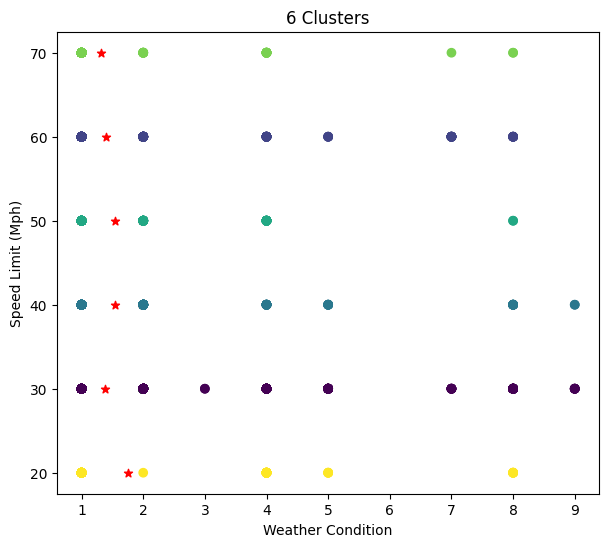

In [145]:
k_means = KMeans(n_clusters=6, random_state=0).fit(weather_speed)
k_means
labels = k_means.labels_
centroids = k_means.cluster_centers_
#Visualization of the Clusters
fig = plt.figure(figsize=(7, 6)) # set the size of the figure
# define which data is x, y, z
plt.scatter(x=weather_speed['weather_conditions'], y = weather_speed['speed_limit'], c = labels, cmap = 'viridis')
plt.scatter(centroids[:,1], centroids[:,0], color= 'red',marker='*')
# Add labels to the plot and a title
plt.title("6 Clusters")
plt.xlabel("Weather Condition")
plt.ylabel("Speed Limit (Mph)")
plt.show()


The clusters are between (1) and (2), which was when the weather was either fine or raining without high winds.

In [146]:
location_clust_df['road_type'] = all_df['road_type']
column_names = ['speed_limit', 'road_type']  
road_speed = location_clust_df[column_names]
road_speed.sample(3)

,speed_limit,road_type
84572,30,6
87330,30,6
84135,30,6


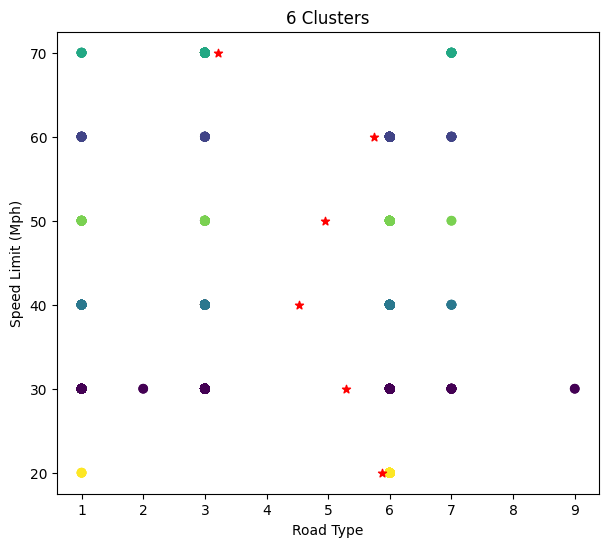

In [147]:
k_means2 = KMeans(n_clusters=6, random_state=0).fit(road_speed)
labels2 = k_means2.labels_
centroids2 = k_means2.cluster_centers_
#Visualization of the Clusters
fig = plt.figure(figsize=(7, 6)) # set the size of the figure
# define which data is x, y, z
plt.scatter(x=road_speed['road_type'], y = road_speed['speed_limit'], c = labels2, cmap = 'viridis')
plt.scatter(centroids2[:,1], centroids2[:,0], color= 'red',marker='*')
# Add labels to the plot and a title
plt.title("6 Clusters")
plt.xlabel("Road Type")
plt.ylabel("Speed Limit (Mph)")
plt.show()


The clusters around Dual carriageway and Single carriageway (3 and 6) indicate the impact of 70 speed limit on Dual carriageway, and 20 and 60 speed limit impact on  Single carriageway.

In [148]:
location_clust_df['light_conditions'] = all_df['light_conditions']
column_names = ['light_conditions', 'weather_conditions']  
light_weather = location_clust_df[column_names]
light_weather.sample(3)

,light_conditions,weather_conditions
86761,1,1
87150,6,1
87057,1,8


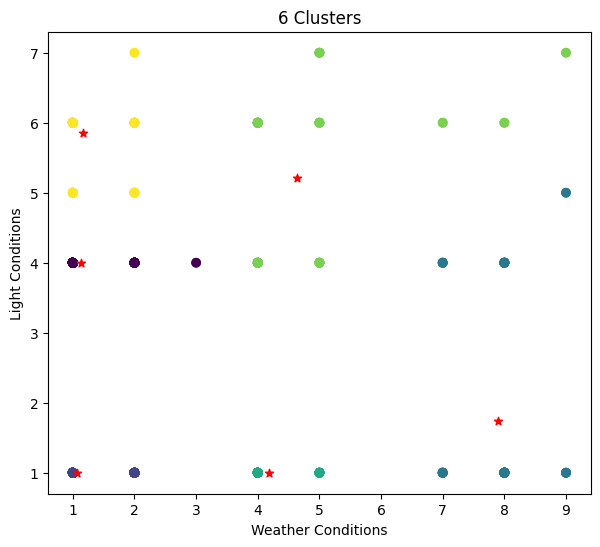

In [149]:
k_means3 = KMeans(n_clusters=6, random_state=0).fit(light_weather)
labels3 = k_means3.labels_
centroids3 = k_means3.cluster_centers_
#Visualization of the Clusters
fig = plt.figure(figsize=(7, 6)) # set the size of the figure
# define which data is x, y, z
plt.scatter(x=light_weather['weather_conditions'], y = light_weather['light_conditions'], c = labels3, cmap = 'viridis')
plt.scatter(centroids3[:,1], centroids3[:,0], color= 'red',marker='*')
# Add labels to the plot and a title
plt.title("6 Clusters")
plt.xlabel("Weather Conditions")
plt.ylabel("Light Conditions")
plt.show()

This cluster (1) reveals that weather was fine without high winds when accidents occured in darkness 4 and 6, either with street light or no street lighting.

# TASK 6

## Using outlier detection methods, identify unusual entries in your data set. Should you keep these entries in your data? 

In [150]:
# Merging accident, vehicle, casualty, and LSOA datasets 
uncleaned_merged_df = (
    accident_df_2020
    .merge(vehicle_df_2020, on='accident_index')
    .merge(casualty_df_2020, on='accident_index')
)

uncleaned_merged_df.head()

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,6,3,9,5,0,0,0,0,1,4
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,5,3,5,9,0,0,0,0,1,3
4,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,8,2,4,1,0,0,0,0,1,3


In [151]:
uncleaned_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 220435 entries, 0 to 220434
Data columns (total 81 columns):
 #   Column                                       Non-Null Count   Dtype  
---  ------                                       --------------   -----  
 0   accident_index                               220435 non-null  object 
 1   accident_year_x                              220435 non-null  int64  
 2   accident_reference_x                         220435 non-null  object 
 3   location_easting_osgr                        220401 non-null  float64
 4   location_northing_osgr                       220401 non-null  float64
 5   longitude                                    220401 non-null  float64
 6   latitude                                     220401 non-null  float64
 7   police_force                                 220435 non-null  int64  
 8   accident_severity                            220435 non-null  int64  
 9   number_of_vehicles                           220435 non-nul

In [152]:
uncleaned_merged_df.shape # Check the shape for the dataframe

(220435, 81)

In [153]:
uncleaned_merged_df.duplicated().sum() # Checking for duplicates

0

In [154]:
uncleaned_merged_df.columns

Index(['accident_index', 'accident_year_x', 'accident_reference_x',
       'location_easting_osgr', 'location_northing_osgr', 'longitude',
       'latitude', 'police_force', 'accident_severity', 'number_of_vehicles',
       'number_of_casualties', 'date', 'day_of_week', 'time',
       'local_authority_district', 'local_authority_ons_district',
       'local_authority_highway', 'first_road_class', 'first_road_number',
       'road_type', 'speed_limit', 'junction_detail', 'junction_control',
       'second_road_class', 'second_road_number',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag', 'lsoa_of_accident_location', 'vehicle_index',
       'accident_year_y', 'accident_reference_y', 'vehicle_reference_x',
   

## Isolation Forests

In [155]:
# Filter the dataset to include only numeric columns as Isolation Foreset does not work on columns with strings

iso_dataframe = uncleaned_merged_df[['junction_detail', 'age_band_of_driver', 'vehicle_location_restricted_lane', 'speed_limit', 'number_of_casualties',
                                     'casualty_severity', 'road_type', 'weather_conditions', 'pedestrian_crossing_human_control',
                                     'age_of_vehicle', 'vehicle_type', 'second_road_number', 'engine_capacity_cc', 'age_of_casualty', 
                                     'special_conditions_at_site','casualty_class', 'pedestrian_location', 'age_of_driver',
                                     'urban_or_rural_area', 'first_road_class', 'number_of_vehicles', 'light_conditions', 
                                     'road_surface_conditions', 'pedestrian_movement', 'propulsion_code', 'towing_and_articulation', 
                                     'junction_location', 'pedestrian_crossing_physical_facilities', 'vehicle_leaving_carriageway', 
                                     'special_conditions_at_site', 'car_passenger', 'bus_or_coach_passenger', 
                                     'hit_object_off_carriageway', 'hit_object_in_carriageway', 'local_authority_district']]

In [156]:
# First you normalize the data


standard_scaler = StandardScaler()

# Apply standard scaling
scaled_features = standard_scaler.fit_transform(iso_dataframe)

# "scaled_features" now contains the standardized values of the original features in 'iso_dataframe'


In [157]:
# Initialize the Isolation Forest Model
isolation_forest_model = IsolationForest()

# Train the Isolation Forest model on the scaled feature data
isolation_forest_model.fit(scaled_features)

# Predict outliers using the trained Isolation Forest model and add the results to the DataFrame as an 'outliers' column
iso_dataframe['outliers'] = isolation_forest_model.predict(scaled_features)


In [158]:
iso_dataframe.head()

,junction_detail,age_band_of_driver,vehicle_location_restricted_lane,speed_limit,number_of_casualties,casualty_severity,road_type,weather_conditions,pedestrian_crossing_human_control,age_of_vehicle,...,junction_location,pedestrian_crossing_physical_facilities,vehicle_leaving_carriageway,special_conditions_at_site,car_passenger,bus_or_coach_passenger,hit_object_off_carriageway,hit_object_in_carriageway,local_authority_district,outliers
0,0,6,0,20,1,3,6,9,9,6,...,0,9,0,0,0,0,0,0,10,-1
1,9,7,0,20,2,3,6,1,0,2,...,2,4,0,0,0,0,0,0,9,1
2,9,7,0,20,2,3,6,1,0,2,...,2,4,0,0,0,0,0,0,9,1
3,3,-1,0,30,1,3,6,1,0,-1,...,0,0,0,0,0,0,0,0,1,1
4,0,7,0,30,1,2,6,1,0,8,...,0,4,0,0,0,0,0,0,17,1


In [159]:

def outliers_detection(dataframe):
    # Instantiate the standard scaler
    standard_scaler = StandardScaler()

    # Scale the features in the dataframe using the scaler
    scaled_features = standard_scaler.fit_transform(dataframe)

    # Initialize the Isolation Forest Model
    isolation_forest_model = IsolationForest()

    # Train the Isolation Forest model on the scaled feature data
    isolation_forest_model.fit(scaled_features)

    # Predict outliers using the trained Isolation Forest model and add the results to the DataFrame as an 'outliers' column
    dataframe['outliers'] = isolation_forest_model.predict(scaled_features)

    # Filter the dataset to show the predicted outlier
    detected_outliers = dataframe[dataframe["outliers"] == -1]

    return detected_outliers

In [160]:
# Calling the function above
outlier_data = outliers_detection(iso_dataframe)
outlier_data.head()

,junction_detail,age_band_of_driver,vehicle_location_restricted_lane,speed_limit,number_of_casualties,casualty_severity,road_type,weather_conditions,pedestrian_crossing_human_control,age_of_vehicle,...,junction_location,pedestrian_crossing_physical_facilities,vehicle_leaving_carriageway,special_conditions_at_site,car_passenger,bus_or_coach_passenger,hit_object_off_carriageway,hit_object_in_carriageway,local_authority_district,outliers
0,0,6,0,20,1,3,6,9,9,6,...,0,9,0,0,0,0,0,0,10,-1
10,9,6,0,30,1,2,3,8,0,8,...,6,0,0,0,0,0,0,0,5,-1
11,9,6,0,30,1,2,3,8,0,0,...,6,0,0,0,0,0,0,0,5,-1
29,0,6,99,50,2,3,3,7,9,5,...,0,9,9,0,0,0,99,99,15,-1
30,0,6,99,50,2,3,3,7,9,5,...,0,9,9,0,1,0,99,99,15,-1


In [161]:
# Inspecting the outlier data
outlier_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
junction_detail,17383.0,19.358166,36.205680,0.0,1.0,3.0,7.0,99.0
age_band_of_driver,17383.0,3.847495,4.029182,-1.0,-1.0,6.0,7.0,11.0
vehicle_location_restricted_lane,17383.0,71.523960,43.972550,-1.0,9.0,99.0,99.0,99.0
speed_limit,17383.0,29.568832,11.365654,-1.0,20.0,30.0,30.0,70.0
number_of_casualties,17383.0,1.441638,1.231853,1.0,1.0,1.0,1.0,19.0
casualty_severity,17383.0,2.840246,0.434090,1.0,3.0,3.0,3.0,3.0
road_type,17383.0,5.611517,2.334519,1.0,3.0,6.0,6.0,9.0
weather_conditions,17383.0,2.719151,2.938805,1.0,1.0,1.0,2.0,9.0
pedestrian_crossing_human_control,17383.0,3.353621,4.331793,-1.0,0.0,0.0,9.0,9.0
age_of_vehicle,17383.0,4.715469,6.098776,-1.0,-1.0,3.0,9.0,63.0


### Another Outlier Detection Method
## Multiple of Interquartile Range (IQR) method

In [162]:
# This function will identify irregularities within the specified columns of a DataFrame using the Interquartile Range (IQR) method.
def identify_irregularities(input_data, columns):
    
    # List to hold the indices of irregularities
    irregular_indices = []

    # Iterate through each specified column
    for col_name in columns:
        # Retrieve the data for the current column
        col_values = input_data[col_name]

        # Compute quartile values
        first_quartile = col_values.quantile(0.25)
        third_quartile = col_values.quantile(0.75)

        # Calculate Interquartile Range
        iqr_value = third_quartile - first_quartile

        # Determine bounds for regular data
        lower_whisker = first_quartile - 1.5 * iqr_value
        upper_whisker = third_quartile + 1.5 * iqr_value

        # Find irregularities, values that fall outside the boundaries
        irregularities = col_values[np.logical_or(col_values < lower_whisker, col_values > upper_whisker)]

        # Add the indices of the irregularities
        irregular_indices.extend(irregularities.index)

    # Create and return a DataFrame containing only the irregularities
    irregularities_data_frame = input_data.loc[irregular_indices]

    return irregularities_data_frame


In [163]:
uncleaned_merged_df = uncleaned_merged_df.drop(['longitude','latitude','accident_index','accident_year_x','accident_reference','accident_reference_x', 'accident_year_y',
'date','day_of_week','time','driver_imd_decile','vehicle_direction_to','vehicle_index','accident_year_y', 'accident_reference_y', 'vehicle_reference_x','generic_make_model',
'police_force','driver_home_area_type','vehicle_left_hand_drive','vehicle_direction_from','did_police_officer_attend_scene_of_accident','local_authority_district','local_authority_highway',
'lsoa_of_accident_location','towing_and_articulation','vehicle_reference_y','casualty_home_area_type','casualty_imd_decile',
 'journey_purpose_of_driver','location_easting_osgr','location_northing_osgr', 'casualty_index', 'accident_year', 'local_authority_ons_district'], axis=1)

In [164]:
colums = ['age_of_vehicle', 'age_of_driver']

In [165]:
irregularities_df = identify_irregularities(uncleaned_merged_df, columns)
irregularities_df.describe().T

,count,mean,std,min,25%,50%,75%,max
accident_severity,139153.0,2.775305,0.454759,1.0,3.0,3.0,3.0,3.0
number_of_vehicles,139153.0,1.879061,0.874735,1.0,1.0,2.0,2.0,10.0
number_of_casualties,139153.0,1.521318,1.069019,1.0,1.0,1.0,2.0,13.0
first_road_class,139153.0,4.105244,1.380012,1.0,3.0,3.0,6.0,6.0
first_road_number,139153.0,827.803051,1601.146140,0.0,0.0,57.0,579.0,9174.0
road_type,139153.0,5.310133,1.798937,1.0,6.0,6.0,6.0,9.0
speed_limit,139153.0,32.637557,11.527431,-1.0,30.0,30.0,30.0,70.0
junction_detail,139153.0,6.567692,18.962642,0.0,0.0,3.0,6.0,99.0
junction_control,139153.0,1.976098,2.552733,-1.0,-1.0,2.0,4.0,9.0
second_road_class,139153.0,3.343155,2.642997,-1.0,0.0,4.0,6.0,6.0


### Boxplots to show some outlier columns 

In [166]:
def plot_boxplots(data, columns_to_plot):
    # Set the number of rows and columns for subplots
    n_rows = 2
    n_cols = 3

    # Set up the subplots
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 10))

    # Iterate through the columns and axes to plot each boxplot
    for idx, col_name in enumerate(columns_to_plot):
        row_idx = idx // n_cols
        col_idx = idx % n_cols
        sns.boxplot(x=data[col_name], ax=axes[row_idx, col_idx])
        axes[row_idx, col_idx].set_title(f'Box plot for {col_name}')

    # Adjust layout
    plt.tight_layout()
    plt.savefig('some_outliers_plot.png')
    plt.show()


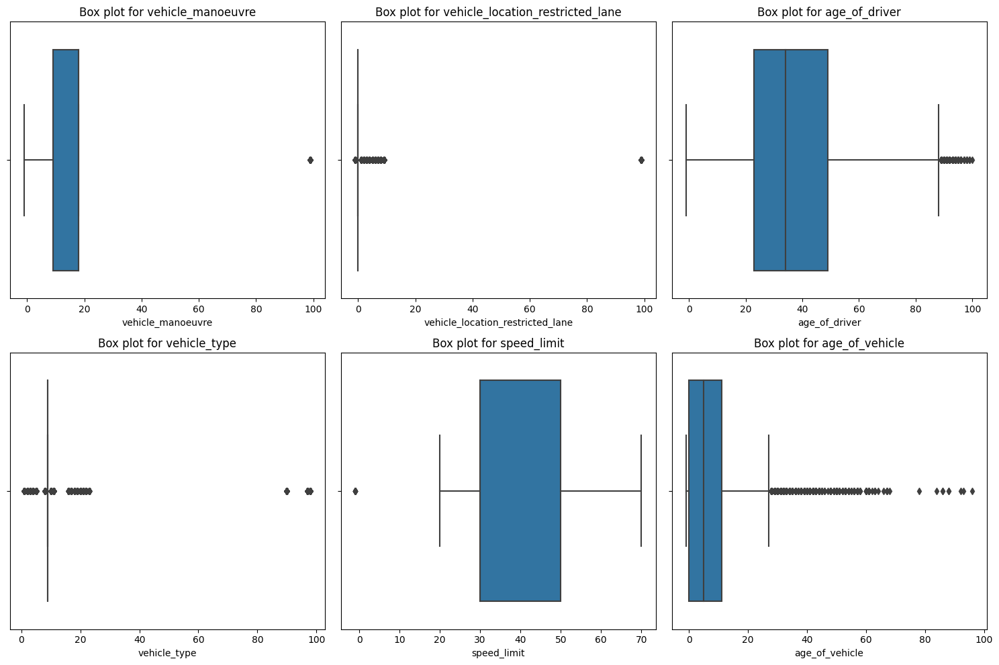

In [167]:
# Specify the columns you want to plot
columns_to_plot = ['vehicle_manoeuvre', 'vehicle_location_restricted_lane', 'age_of_driver', 
                   'vehicle_type', 'speed_limit', 'age_of_vehicle']

# Call the function with the DataFrame and columns
plot_boxplots(uncleaned_merged_df, columns_to_plot)


The box plot visualises the notable outliers that was detected by both  the Isolation forest and Multiple of Interquartile Range (IQR) outliers detection method. These outliers are the individual data points that are further away from the rest of the data and are plotted as individual points beyond the whiskers(lower and upper). These datapoints are shown to be more than 1.5 times the interquartile range (the distance between the 75th percentile and the 25th percentile) away from the nearest quartile.

From domain knowledge, some of the detected outliers are not unusual as they are within a realistic range. However, the negative 1 (-1) values will be cleaned as they are anomalies and out of range, for instance, the -1 in age of driver, age of vehicle, speed limit columns etc., are all abnormal record and are recorded as missing data in https://data.dft.gov.uk/road-accidents-safety-data/Road-Safety-Open-Dataset-Data-Guide.xlsx the data guide by the Department of Transport on Road Safety data. 

In a realistic context, the "age of vehicle" and  "age of driver" should not be represented as -1. It is unlikely that a vehicle  or a driver would have a negative age. A negative age would imply that the vehicle was manufactured or registered before its actual production date, which is not logically possible. All negative 1 will be converted to NaN (Not a Number), then filled with Multiple Imputation by Chained Equations (MICE), explained above.  This approach aims to provide a more accurate estimation of the missing values without being influenced by extreme data points.

### CLEAN THE DATA

The -1 data which are missing data and outliers will be cleaned by calling the function I wrote earlier to convert them to NaN and finally imputing the missing values with MICE.

In [168]:
# Calling the function that will convert to NaN
cleaned_df = convert_invalid_to_nan(uncleaned_merged_df)


Successfully replaced invalid values with NaN in columns: speed_limit, junction_detail, junction_control, second_road_class, second_road_number, pedestrian_crossing_human_control, pedestrian_crossing_physical_facilities, light_conditions, weather_conditions, road_surface_conditions, special_conditions_at_site, carriageway_hazards, trunk_road_flag, vehicle_manoeuvre, vehicle_location_restricted_lane, junction_location, skidding_and_overturning, hit_object_in_carriageway, vehicle_leaving_carriageway, hit_object_off_carriageway, first_point_of_impact, sex_of_driver, age_of_driver, age_band_of_driver, engine_capacity_cc, propulsion_code, age_of_vehicle, sex_of_casualty, age_of_casualty, age_band_of_casualty, pedestrian_location, pedestrian_movement, car_passenger, bus_or_coach_passenger, pedestrian_road_maintenance_worker
Successfully converted column 'speed_limit' back to integer.
Successfully converted column 'junction_detail' back to integer.
Successfully converted column 'junction_cont

In [169]:
# Calling the MICE function to impute missing values
cleaned_df = impute_missing_values(cleaned_df, verbose=True) 

MICE imputation applied for 3 iterations.
Imputation completed successfully.


## TASK 7
### Can you develop a classification model using the provided data that accurately predicts fatal injuries sustained in road traffic accidents, with the aim of informing and improving road safety measures?

In [170]:
y_pred = cleaned_df['accident_severity']
y_pred.value_counts()

3    171376
2     44828
1      4231
Name: accident_severity, dtype: int64

In [171]:
# Mapping of values of y_pred tolabels
y_pred_mapping = {1: 'Fatal', 2: 'Non-Fatal', 3: 'Non-Fatal'}

# Replace values with labels using the mapping
y_pred = y_pred.replace(y_pred_mapping)

In [172]:
y_pred.value_counts()

Non-Fatal    216204
Fatal          4231
Name: accident_severity, dtype: int64

### The data is highly imbalanced

In [173]:
# Applying RandomUnderSampler to balance the classes
sampler = RandomUnderSampler() # Initialize the RandomUnderSampler

# Use the sampler to resample the dataset and balance the classes
features, target = sampler.fit_resample(cleaned_df, y_pred)

target.value_counts()


Fatal        4231
Non-Fatal    4231
Name: accident_severity, dtype: int64

In [174]:
# Drop the target column
del features['accident_severity']

In [175]:
# Extract numerical features from the balanced data
numerical_features = features.select_dtypes(include=[np.number])
# Initialize a SelectKBest object with f_classif method to choose the top 15 features
feature_selector = SelectKBest(score_func=f_classif, k=15)

# Apply the selector to the numerical features and the corresponding target labels
feature_selector.fit(numerical_features, target)



SelectKBest(k=15)

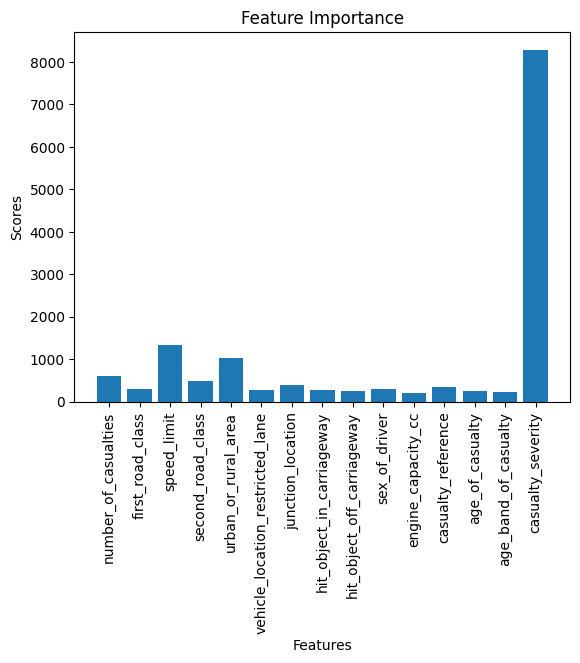

In [176]:
# Obtain the boolean mask for the top-selected features
selected_features_mask = feature_selector.get_support()

# Retrieve the names of the top-selected features
selected_feature_names = feature_selector.feature_names_in_[selected_features_mask]

# Retrieve the corresponding scores of the top-selected features
selected_feature_scores = feature_selector.scores_[selected_features_mask]

# Plot a bar chart to visualize the feature scores
plt.bar(selected_feature_names, selected_feature_scores)
plt.xticks(rotation="vertical")
plt.title("Feature Importance")
plt.xlabel("Features")
plt.ylabel("Scores")
plt.show()


### Decision Tree Classifier 

#### Building the model

In [177]:
# Divide the dataset into training (70%) and testing (30%) parts
training_features, testing_features, training_labels, testing_labels = train_test_split(numerical_features, 
                                                    target, test_size=0.3, random_state=5)

# Instantiate a Decision Tree classifier with a minimum of 100 samples per leaf
decision_tree_classifier = DecisionTreeClassifier(min_samples_leaf=100)

# Perform 10-fold cross-validation on the training set, measuring accuracy, and store the resulting estimators
cross_validation_results = cross_validate(decision_tree_classifier, training_features, training_labels, 
                                          cv=10, scoring="accuracy", return_estimator=True)
cross_validation_results

{'fit_time': array([0.03490615, 0.0279243 , 0.02792573, 0.02792501, 0.02792573,
        0.02892256, 0.02792621, 0.02892256, 0.02792382, 0.02792573]),
 'score_time': array([0.00399017, 0.00499177, 0.004987  , 0.00398827, 0.00498652,
        0.00498629, 0.0039885 , 0.00399041, 0.00498772, 0.00498414]),
 'estimator': [DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100)],
 'test_score': array([0.9005059 , 0.90893761, 0.89713322, 0.8597973 , 0.91554054,
        0.88851351, 0.87331081, 0.90709459, 0.89695946, 0.89358108])}

In [178]:
# Print the output in a dataframe
# Create a DataFrame from the results_tree data
dct_res = pd.DataFrame(cross_validation_results)
dct_res

,fit_time,score_time,estimator,test_score
0,0.034906,0.003990,DecisionTreeClassifier(min_samples_leaf=100),0.900506
1,0.027924,0.004992,DecisionTreeClassifier(min_samples_leaf=100),0.908938
2,0.027926,0.004987,DecisionTreeClassifier(min_samples_leaf=100),0.897133
3,0.027925,0.003988,DecisionTreeClassifier(min_samples_leaf=100),0.859797
4,0.027926,0.004987,DecisionTreeClassifier(min_samples_leaf=100),0.915541
5,0.028923,0.004986,DecisionTreeClassifier(min_samples_leaf=100),0.888514
6,0.027926,0.003989,DecisionTreeClassifier(min_samples_leaf=100),0.873311
7,0.028923,0.003990,DecisionTreeClassifier(min_samples_leaf=100),0.907095
8,0.027924,0.004988,DecisionTreeClassifier(min_samples_leaf=100),0.896959
9,0.027926,0.004984,DecisionTreeClassifier(min_samples_leaf=100),0.893581


In [179]:
# Function that will take cross-validation results and the testing data then evaluates the classifier using the estimator

def evaluate_best_estimator(cross_validation_results, testing_features, testing_labels):
    # Find the index of the best estimator (highest test score)
    best_estimator_index = np.argmax(cross_validation_results['test_score'])
    
    # Get the best estimator
    best_estimator = cross_validation_results['estimator'][best_estimator_index]
    
    # Use the best estimator to make predictions on the test data
    predictions = best_estimator.predict(testing_features)
    
    # Calculate and print the classification report
    report = classification_report(testing_labels, predictions)
    print(report)

    # Return the best estimator for further use if needed
    return best_estimator

# Usage example:
best_model = evaluate_best_estimator(cross_validation_results, testing_features, testing_labels)


              precision    recall  f1-score   support

       Fatal       0.87      0.92      0.90      1230
   Non-Fatal       0.92      0.87      0.90      1309

    accuracy                           0.90      2539
   macro avg       0.90      0.90      0.90      2539
weighted avg       0.90      0.90      0.90      2539



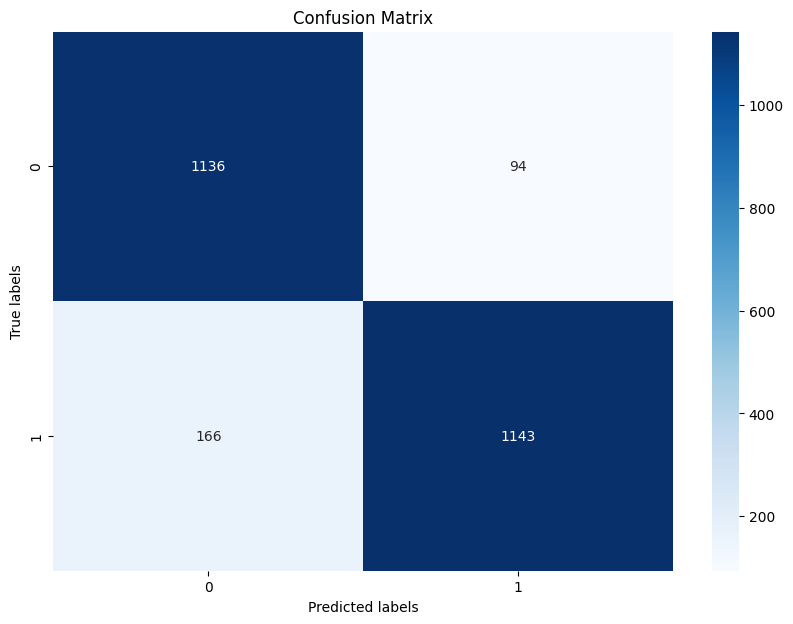

In [180]:
# Plotting the cofusion matrix

# Find the index of the best estimator (highest test score)
best_estimator_index = np.argmax(dct_res['test_score'])

# Get the best estimator
best_estimator = dct_res['estimator'][best_estimator_index]

# Use the best estimator to make predictions on the test data
predictions = best_estimator.predict(testing_features)

# Create the confusion matrix
cm = confusion_matrix(testing_labels, predictions)

# Plot the confusion matrix
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.savefig('confusion_matrix.png')
plt.show()


In [181]:
# Printing the confusion Matrix
print('Confusion Matrix: ')
print(confusion_matrix(testing_labels, predictions))

Confusion Matrix: 
[[1136   94]
 [ 166 1143]]


Thi model demonstrates high accuracy, precision, recall, and F1-score values, which was all around 90%. This uniformity strongly suggests that the model is both accurate and balanced in its predictions for both "Fatal" and "Non-Fatal" injuries sustained in road traffic accidents. The confusion matrix further supports these findings, as it shows the model has made more correct predictions ( 1193 true positives and 1095 true negatives) than incorrect ones (135 false positives and 116 false negatives). Generally, these results indicate that the model is highly capable of informing and potentially enhancing road safety measures through accurate predictions of accident severity.

# Reference
Road Safety Data Guide. (2022) Road Safety Data. Available online: https://www.data.gov.uk/dataset/cb7ae6f0-4be6-4935-9277-47e5ce24a11f/road-safety-data [Accessed 13/8/2023].

Stacked bar chart — Matplotlib 3.3.4 documentation. (n.d.) matplotlib.org. Available online: https://matplotlib.org/stable/gallery/lines_bars_and_markers/bar_stacked.html [Accessed 10/8/2023].
